In [ ]:
#clone all the genomes data

!git clone https://github.com/Shinzen31/models_gapfilled.git

# -*- coding: utf-8 -*-

########################################
# 1. Environment Setup and Dependency Installation (can be executed in Colab)
########################################
!pip install -q gurobipy cobra modelseedpy pyrodigal biopython

import warnings
from sklearn.exceptions import InconsistentVersionWarning
warnings.filterwarnings("ignore", category=InconsistentVersionWarning)

import os, glob, gzip, shutil, re

# Configure the Gurobi license (please replace with your own WLSACCESSID, WLSSECRET, LICENSEID)
WLSACCESSID = "9cff747c-69bf-432f-8a5e-626093428473"
WLSSECRET   = "94a4f3c2-913b-4777-ad5a-9d9598a0f84c"
LICENSEID   = "2646038"

os.makedirs("/content/licenses", exist_ok=True)
gurobi_lic_text = f"""# Gurobi WLS license file
WLSACCESSID={WLSACCESSID}
WLSSECRET={WLSSECRET}
LICENSEID={LICENSEID}
"""
with open("/content/licenses/gurobi.lic", "w") as f:
    f.write(gurobi_lic_text)
os.environ["GRB_LICENSE_FILE"] = "/content/licenses/gurobi.lic"

import gurobipy
print("Gurobi ready!")

import cobra
try:
    test_m = cobra.io.load_model("textbook")
    sol = test_m.optimize()
    print("COBRApy ok! textbook obj =", sol.objective_value)
except Exception as e:
    print("COBRApy fallback test:", e)


Cloning into 'models_gapfilled'...
remote: Enumerating objects: 57, done.
remote: Counting objects: 100% (57/57), done.
remote: Compressing objects: 100% (57/57), done.
remote: Total 57 (delta 45), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (57/57), 1.81 MiB | 798.00 KiB/s, done.
Resolving deltas: 100% (45/45), done.
Updating files: 100% (41/41), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 467.6/467.6 kB 11.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.5/14.5 MB 54.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 39.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.1/175.1 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 56.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 49.1 MB/s 

In [ ]:
model = cobra.io.read_sbml_model("/content/models_gapfilled/GCF_964065165.1_Levilactobacillus_yonginensis_CIRM-BIA2544_protein_gapfilled_noO2_appliedMedium.xml")

model.optimize()

,fluxes,reduced_costs
rxn08300_c0,0.000000,0.0
rxn19699_c0,-346.228106,0.0
rxn01603_c0,0.000000,0.0
rxn01799_c0,2.567260,0.0
rxn06628_c0,-0.809388,0.0
...,...,...
EX_cpd00314_e0,0.000000,0.0
EX_cpd00794_e0,-9.771246,0.0
EX_cpd00001_e0,0.000000,0.0
EX_cpd00156_e0,-3.184747,0.0


In [ ]:
media_mets = {}

with open("models_gapfilled/group_medium_exchanges.tsv") as f:
  f.readline()
  for line in f:
    cols = line.strip().split("\t")
    media_mets[cols[0]] = cols[2]

#find the water
media_mets["EX_cpd00001_e0"] = "h20"

metabolite_ids = list(media_mets.keys())
water_index = metabolite_ids.index("EX_cpd00001_e0")
print(water_index, media_mets[metabolite_ids[water_index]])

#media_mets_keys

77 h20


1) Create the environment ball of size k (k random environments); save this to a tsv file.

2) make a class that allows me to do things with models and this distribution (https://github.com/danielriosgarza/NutritionOrNature/blob/main/Scripts/Env_ball_class.py)

In [ ]:
'''
# make an environment ball
import numpy as np
num_metabolites = 175

random_media = np.random.dirichlet(np.ones(38))

idx_water = 4？

random_media/=random_media[idx_water]
random_media*=10
print(random_media)
print(sum(random_media))
'''

# make an environment ball (anaerobic: no "o2")
import numpy as np
import csv

# 1) Define a list of 38 metabolite IDs, excluding oxygen.
#    Here we have four fixed entries ("glc", "co2", "nh4", and "h2o")
#    plus additional entries from "met_5" to "met_38" (inclusive).


# 2) Determine how many metabolites there are.
num_metabolites = len(metabolite_ids)
print("Number of metabolites:", num_metabolites)

# 3) Find the index for water (labeled 'h2o').
try:
    idx_water = metabolite_ids.index("EX_cpd00001_e0")
except ValueError:
    raise ValueError("Could not find 'h2o' in the metabolite list.")

# 4) Generate a random medium composition using the Dirichlet distribution,
#    producing a probability vector of length 'num_metabolites' whose sum is 1.
  random_media = np.random.dirichlet(np.ones(num_metabolites))

# 5) Normalize so that the value at the water index is exactly 10:
#    divide by the current water value (making it 1), then multiply by 10.
# 7) Print the sum of all metabolite values.
print("\nSum of the environment composition:", sum(random_media))

random_media /= random_media[idx_water]
random_media *= 10

# 6) Print the resulting composition, verifying that water is set to 10.
print("Environment composition:")
for met_id, val in zip(metabolite_ids, random_media):
    print(f"{met_id}: {val}")



# 8) Save the medium composition to a TSV file.
output_filename = "environment_ball.tsv"
with open(output_filename, mode="w", newline="") as file:
    tsv_writer = csv.writer(file, delimiter="\t")
    # Write header
    tsv_writer.writerow(["metabolite_id", "concentration"])
    # Write rows: each metabolite and its corresponding concentration
    for met_id, val in zip(metabolite_ids, random_media):
        tsv_writer.writerow([met_id, val])

print(f"\nEnvironment ball composition saved to '{output_filename}'")



Number of metabolites: 175

Sum of the environment composition: 1.0000000000000002
Environment composition:
EX_cpd00063_e0: 32.11121084909064
EX_cpd00034_e0: 23.486463582676038
EX_cpd00118_e0: 32.10067973201848
EX_cpd00254_e0: 5.410862139369106
EX_cpd00104_e0: 8.081615112559486
EX_cpd00028_e0: 55.20808938901747
EX_cpd00166_e0: 13.743291165464612
EX_cpd00092_e0: 11.37095012613775
EX_cpd00220_e0: 2.059051720341588
EX_cpd00030_e0: 51.54220833612976
EX_cpd10516_e0: 30.748333989439217
EX_cpd00305_e0: 33.66223371814763
EX_cpd00099_e0: 34.880690192909036
EX_cpd15560_e0: 41.09909780960953
EX_cpd00540_e0: 19.427888805846834
EX_cpd00205_e0: 4.149034107880947
EX_cpd00058_e0: 2.277005076667303
EX_cpd00264_e0: 2.9078135828264697
EX_cpd00268_e0: 42.26292907100111
EX_cpd00180_e0: 14.43114579720568
EX_cpd00047_e0: 43.81566822865567
EX_cpd03453_e0: 13.065107342483188
EX_cpd03726_e0: 4.680530178723411
EX_cpd01157_e0: 98.32549334432942
EX_cpd00067_e0: 19.183545591601938
EX_cpd00076_e0: 2.6372519726777983

In [ ]:
# -*- coding: utf-8 -*-
"""
1) Both models use the same medium env_dict;
2) Obtain the objective values x and y for the two models respectively;
3) For each metabolite, compute the new medium concentration using (x * met_model1 + y * met_model2) / (x + y);
4) Apply this new medium to Model1 only and print the results, without modifying the original model.
"""

import cobra
import pandas as pd
import os

#########################
# 1) Read the common medium file "environment_ball.tsv"
#########################
env_df = pd.read_csv("environment_ball.tsv", sep="\t")
env_dict = dict(zip(env_df["metabolite_id"], env_df["concentration"]))

#########################
# Define a function to apply the medium to the model's exchange reactions
#########################
def apply_environment_to_model(model: cobra.Model, environment: dict, default_secretion = 100):
    """
    Assume that exchange reaction IDs are formatted as "EX_<metaboliteID>".
    Set the lower bound to -concentration (allowing uptake) and the upper bound to default_uptake.
    """
    for rxn_id, conc in environment.items():
        if model.reactions.has_id(rxn_id):
            rxn = model.reactions.get_by_id(rxn_id)
            rxn.lower_bound = -conc
            rxn.upper_bound = default_secretion

#########################
# 2) Load the two models and apply the same medium
#########################
repo_path = "models_gapfilled"
model1_path = os.path.join(repo_path, "GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml")
model2_path = os.path.join(repo_path, "GCF_964063395.1_Pediococcus_parvulus_F2-sp2-RGJ_protein_gapfilled_noO2_appliedMedium.xml")

model1 = cobra.io.read_sbml_model(model1_path)
model2 = cobra.io.read_sbml_model(model2_path)

# Apply the same medium to both models
apply_environment_to_model(model1, env_dict)
apply_environment_to_model(model2, env_dict)

# Optimize both models to obtain their objective values
sol1 = model1.optimize()
x = sol1.objective_value

sol2 = model2.optimize()
y = sol2.objective_value

print(x,y)


34.56402481039174 34.56402481039174


In [ ]:
def get_consumptions(model, env_dict):
  consumptions = {i for i in env_dict if (model.reactions.has_id(i)) and (model.reactions.get_by_id(i).flux<0)}
  return consumptions

def get_secretions(model, env_dict):
  secretions = {i for i in env_dict if (model.reactions.has_id(i)) and (model.reactions.get_by_id(i).flux>0)}
  return secretions
'''
def compare_consumptions(model1, model2, env_dict):
  exch1 = get_consumptions(model1, env_dict)
  exch2 = get_consumptions(model2, env_dict)
  return exch1.intersection(exch2)
'''
common = get_consumptions(model1, env_dict).intersection(get_consumptions(model2, env_dict))
secreted = get_secretions(model2, env_dict)

for i in common:
  print(f"model1 = {model1.reactions.get_by_id(i).flux} \t {model2.reactions.get_by_id(i).flux}")

new_env = env_dict.copy()
for i in common:
  new_env[i] = env_dict[i]/(x+y)

for i in secreted:
  new_env[i] = 1000

apply_environment_to_model(model1, new_env)
sol1 = model1.optimize()
z = sol1.objective_value

print(x, z)

factor = z/x
print(factor)

condition = 0

if np.random.uniform()<factor:
  condition = 1
print(condition)

model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.343810775926357 	 -0.11460359197545233
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.05730179598772617
model1 = -0.1719053879631785 	 -0.1719053879631785
23.904867036547486 0.75
0.03137436400936035
0


In [ ]:
# -*- coding: utf-8 -*-
"""
Compute as in the original script:
1) model1 is fixed as GCF_000010425.1_ASM1042v1 …;
2) model2 iterates over all other .xml files in the models_gapfilled directory;
3) For every pair (model1, model2):
   • Optimize each model under the environment_ball.tsv medium to obtain x and y;
   • Find common consumptions (common) and secretions of model2 (secreted);
   • Use the original formula new_env[i] = env_dict[i]/(x + y) and set secreted metabolites to 1000;
   • Apply new_env only to model1, then optimize to obtain z;
   • Print x, y, z, factor = z/x, and the random-draw condition;
4) Record and output the model2 with the largest factor.
"""

import os, random
import numpy as np
import pandas as pd
import cobra

########################################################################
# —— Utility functions —— (consistent with the original script)
########################################################################
def apply_environment_to_model(model: cobra.Model,
                               environment: dict,
                               default_secretion: float = 100):
    """Map the medium to exchange reactions: lb = -conc, ub = default_secretion"""
    for rxn_id, conc in environment.items():
        if model.reactions.has_id(rxn_id):
            rxn = model.reactions.get_by_id(rxn_id)
            rxn.lower_bound = -conc
            rxn.upper_bound = default_secretion


def get_consumptions(model, env_dict):
    """Return exchange reactions with flux < 0 (uptake)"""
    return {m for m in env_dict
            if model.reactions.has_id(m) and model.reactions.get_by_id(m).flux < 0}


def get_secretions(model, env_dict):
    """Return exchange reactions with flux > 0 (secretion)"""
    return {m for m in env_dict
            if model.reactions.has_id(m) and model.reactions.get_by_id(m).flux > 0}

########################################################################
# —— Read the common medium environment_ball.tsv ——
########################################################################
env_df   = pd.read_csv("environment_ball.tsv", sep="\t")
env_dict = dict(zip(env_df["metabolite_id"], env_df["concentration"]))

########################################################################
# —— Fixed model1 —— (according to your file name)
########################################################################
repo_path   = "models_gapfilled"
model1_file = "GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml"
model1_path = os.path.join(repo_path, model1_file)

# Read the template once and copy it in each round to avoid multiple disk reads
model1_template = cobra.io.read_sbml_model(model1_path)

########################################################################
# —— Iterate through other .xml files in repo_path as model2 ——
########################################################################
best_factor = -np.inf
best_model2 = None

for fname in sorted(os.listdir(repo_path)):
    # Process .xml files only and exclude model1 itself
    if not fname.endswith(".xml") or fname == model1_file:
        continue

    model2_path = os.path.join(repo_path, fname)
    try:
        model2 = cobra.io.read_sbml_model(model2_path)
    except Exception as e:
        print(f"[SKIP] Failed to read {fname}: {e}")
        continue

    # *** Copy a fresh model1 each round to avoid residual changes ***
    model1 = model1_template.copy()

    # ———— ① Optimize under the original medium ————
    apply_environment_to_model(model1, env_dict)
    apply_environment_to_model(model2, env_dict)

    sol1 = model1.optimize()
    x    = sol1.objective_value
    sol2 = model2.optimize()
    y    = sol2.objective_value

    # ———— ② Find common uptakes / secretions ————
    common   = get_consumptions(model1, env_dict).intersection(
               get_consumptions(model2, env_dict))
    secreted = get_secretions(model2, env_dict)

    # —— Print flux of each common substrate (keep the original for-loop) ——
    for met in common:
        print(f"[{fname}] {met}: model1 = {model1.reactions.get_by_id(met).flux} \t "
              f"{model2.reactions.get_by_id(met).flux}")

    # ———— ③ Construct the new weighted medium (only for model1, not saved) ————
    new_env = env_dict.copy()
    for met in common:
        new_env[met] = env_dict[met] / (x + y)
    for met in secreted:
        new_env[met] = 1000

    apply_environment_to_model(model1, new_env)

    # ———— ④ Optimize model1 under the new medium ————
    z = model1.optimize().objective_value

    # ———— ⑤ Compute factor and perform random draw for condition ————
    factor    = z / x if x else 0.0
    condition = 1 if np.random.uniform() < factor else 0

    # —— Print results —— (exactly replicating the original order and variable names)
    print(f"{fname}: model1 = {x}, model2 = {y}, model1_new = {z}")
    print("factor =", factor)
    print("condition =", condition, "\n")

    # —— Update the best factor ——
    if factor > best_factor:
        best_factor = factor
        best_model2 = fname

########################################################################
# —— Output the model2 with the largest factor ——
########################################################################
print(">>> model2 with the largest factor:", best_model2, " (factor =", best_factor, ")")


In [ ]:
# -*- coding: utf-8 -*-
import os, itertools, numpy as np, pandas as pd, cobra
########################################################################
# —— Utility functions (identical to the two-model version) ——
########################################################################
def apply_environment_to_model(model, environment, default_secretion=100):
    for rxn_id, conc in environment.items():
        if model.reactions.has_id(rxn_id):
            rxn = model.reactions.get_by_id(rxn_id)
            rxn.lower_bound = -conc
            rxn.upper_bound = default_secretion

def get_consumptions(model, env_dict):
    return {m for m in env_dict
            if model.reactions.has_id(m) and model.reactions.get_by_id(m).flux < 0}

def get_secretions(model, env_dict):
    return {m for m in env_dict
            if model.reactions.has_id(m) and model.reactions.get_by_id(m).flux > 0}

########################################################################
# —— Common medium: environment_ball.tsv ——
########################################################################
env_dict = dict(pd.read_csv("environment_ball.tsv", sep="\t").values)

########################################################################
# —— model 1 (fixed) ——
########################################################################
repo      = "models_gapfilled"
model1_id = "GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml"
model1_tp = cobra.io.read_sbml_model(os.path.join(repo, model1_id))

########################################################################
# —— Enumerate model 2 + model 3 combinations ——
########################################################################
others = [f for f in os.listdir(repo)
          if f.endswith(".xml") and f != model1_id]
best_factor, best_pair = -np.inf, None

for m2, m3 in itertools.combinations(sorted(others), 2):
    # Load partner models
    try:
        model2 = cobra.io.read_sbml_model(os.path.join(repo, m2))
        model3 = cobra.io.read_sbml_model(os.path.join(repo, m3))
    except Exception as e:
        print(f"[SKIP] Failed to read {m2} or {m3}: {e}")
        continue

    # Copy a clean model 1
    model1 = model1_tp.copy()

    # —— ① Optimize under the original medium ——
    for mdl in (model1, model2, model3):
        apply_environment_to_model(mdl, env_dict)
    x = model1.optimize().objective_value
    y = model2.optimize().objective_value
    w = model3.optimize().objective_value

    # —— ② Common uptake substrates & secreted substrates ——
    common = (get_consumptions(model1, env_dict)
              .intersection(get_consumptions(model2, env_dict))
              .intersection(get_consumptions(model3, env_dict)))
    secreted = (get_secretions(model2, env_dict)
                .union(get_secretions(model3, env_dict)))

    for met in common:   # Print fluxes of common substrates
        f1 = model1.reactions.get_by_id(met).flux
        f2 = model2.reactions.get_by_id(met).flux
        f3 = model3.reactions.get_by_id(met).flux
        print(f"[{m2} | {m3}] {met}: m1={f1} \t m2={f2} \t m3={f3}")

    # —— ③ Construct the weighted medium ——
    new_env = env_dict.copy()
    denom   = x + y + w if (x + y + w) else 1e-9   # avoid division by zero
    for met in common:
        new_env[met] = env_dict[met] / denom
    for met in secreted:
        new_env[met] = 1000

    apply_environment_to_model(model1, new_env)

    # —— ④ Optimize model 1 in the new medium ——
    z      = model1.optimize().objective_value
    factor = z / x if x else 0.0
    print(f"{m2} + {m3}: x={x}, y={y}, w={w}, z={z}, factor={factor}\n")

    if factor > best_factor:
        best_factor = factor
        best_pair   = (m2, m3)

########################################################################
# —— Output the best combination ——
########################################################################
print(">>> Best factor =", best_factor)
print(">>> Partner 1  =", best_pair[0])
print(">>> Partner 2  =", best_pair[1])


流式输出内容被截断，只能显示最后 5000 行内容。
Read LP format model from file /tmp/tmpq2w113iz.lp
Reading time = 0.01 seconds
: 818 rows, 1736 columns, 7908 nonzeros
[GCF_964063355.1_Latilactobacillus_curvatus_CIRM-BIA2781_protein_gapfilled_noO2_appliedMedium.xml | GCF_964063405.1_Leuconostoc_mesenteroides_FLEC04_protein_gapfilled_noO2_appliedMedium.xml] EX_cpd00099_e0: m1=-0.35463669881174115 	 m2=-1.029525860170794 	 m3=-0.4679682627456714
[GCF_964063355.1_Latilactobacillus_curvatus_CIRM-BIA2781_protein_gapfilled_noO2_appliedMedium.xml | GCF_964063405.1_Leuconostoc_mesenteroides_FLEC04_protein_gapfilled_noO2_appliedMedium.xml] EX_cpd00028_e0: m1=-0.35463669881174115 	 m2=-1.029525860170794 	 m3=-0.46796826274561704
[GCF_964063355.1_Latilactobacillus_curvatus_CIRM-BIA2781_protein_gapfilled_noO2_appliedMedium.xml | GCF_964063405.1_Leuconostoc_mesenteroides_FLEC04_protein_gapfilled_noO2_appliedMedium.xml] EX_cpd00254_e0: m1=-0.35463669881174115 	 m2=-1.029525860170794 	 m3=-0.46796826274561704
[GCF_9640633

In [ ]:
#!/usr/bin/env python3
# Beam-Search partner selection — secretions + absorptions + factor

import os
from concurrent.futures import ThreadPoolExecutor
from functools import lru_cache

import cobra
import pandas as pd

# ────── Parameters ──────
MODEL_DIR   = "models_gapfilled"
TARGET_FILE = "GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml"
ENV_FILE    = "environment_ball.tsv"
GROUP_SIZE  = 3            # target + (GROUP_SIZE-1) partners
BEAM_WIDTH  = 5
N_THREADS   = 4
# ────────────────────────

# ---------- Utility functions (identical to the enumeration script) ----------
def apply_environment_to_model(model: cobra.Model,
                               environment: dict,
                               default_secretion: float = 100):
    """Map medium to exchange reactions: lb = -conc, ub = default_secretion."""
    for rxn_id, conc in environment.items():
        if model.reactions.has_id(rxn_id):
            rxn = model.reactions.get_by_id(rxn_id)
            rxn.lower_bound = -conc
            rxn.upper_bound = default_secretion


def get_consumptions(model, env_dict):
    """Exchange reactions with flux < 0 (uptake)."""
    return {m for m in env_dict
            if model.reactions.has_id(m)
            and model.reactions.get_by_id(m).flux < 0}


def get_secretions(model, env_dict):
    """Exchange reactions with flux > 0 (secretion)."""
    return {m for m in env_dict
            if model.reactions.has_id(m)
            and model.reactions.get_by_id(m).flux > 0}

# ---------- Load medium ----------
env_limits = dict(pd.read_csv(ENV_FILE, sep="\t").values)

# ---------- Load target model ----------
target_tpl = cobra.io.read_sbml_model(os.path.join(MODEL_DIR, TARGET_FILE))
target_tpl.solver = "gurobi"
apply_environment_to_model(target_tpl, env_limits)

sol_t       = target_tpl.optimize()
BASE_GROWTH = sol_t.objective_value or 0
target_cons = get_consumptions(target_tpl, env_limits)
print(f"Target alone growth = {BASE_GROWTH:.6f}")

# ---------- Pre-process all candidate partners ----------
partners = {}  # fname -> {'consumes', 'secretes', 'growth'}
for fn in os.listdir(MODEL_DIR):
    if fn == TARGET_FILE or not fn.endswith(".xml"):
        continue
    mdl = cobra.io.read_sbml_model(os.path.join(MODEL_DIR, fn))
    mdl.solver = "gurobi"
    apply_environment_to_model(mdl, env_limits)
    sol = mdl.optimize()
    if sol.status != "optimal":
        continue
    partners[fn] = {
        "consumes": get_consumptions(mdl, env_limits),
        "secretes": get_secretions(mdl, env_limits),
        "growth":   sol.objective_value or 0,
    }

partner_files = list(partners)  # fixed order

# ---------- combo → (growth_z, factor) ----------
@lru_cache(None)
def eval_combo(combo: tuple):
    """Return (z, factor) of target in presence of partners in combo."""
    # common uptakes and secreted metabolites
    common   = target_cons.intersection(*[partners[p]["consumes"] for p in combo])
    secreted = set().union(*[partners[p]["secretes"] for p in combo])

    # build new medium
    denom   = BASE_GROWTH + sum(partners[p]["growth"] for p in combo) or 1e-9
    new_env = env_limits.copy()
    for met in common:
        new_env[met] = env_limits[met] / denom
    for met in secreted:
        new_env[met] = 1000

    m = target_tpl.copy()
    apply_environment_to_model(m, new_env)
    z = m.slim_optimize() or 0
    return z, z / BASE_GROWTH if BASE_GROWTH else 0


# ---------- Beam Search ----------
best_combo, best_factor = None, float("-inf")   # store only size == GROUP_SIZE-1
beam = [()]                                     # start with empty combo

for depth in range(1, GROUP_SIZE):
    cand, futures = [], {}
    with ThreadPoolExecutor(max_workers=N_THREADS) as pool:
        for combo in beam:
            used = set(combo)
            for p in partner_files:
                if p in used:
                    continue
                new_combo = tuple(sorted(combo + (p,)))
                if new_combo not in futures:
                    futures[new_combo] = pool.submit(eval_combo, new_combo)

        for combo, fut in futures.items():
            z, factor = fut.result()
            cand.append((combo, factor))

            # update best only when combo reaches target size
            if len(combo) == GROUP_SIZE - 1 and factor > best_factor:
                best_combo, best_factor = combo, factor

    # next beam layer
    cand.sort(key=lambda x: x[1], reverse=True)
    if not cand:
        break
    beam = [c for c, _ in cand[:BEAM_WIDTH]]
    print(f"Depth {depth}: beam best factor = {cand[0][1]:.6f}")

# ---------- Results ----------
print("\n===== RESULT =====")
if best_combo is None:
    print("No feasible partner combination of size", GROUP_SIZE - 1)
else:
    print("Best partners:", list(best_combo))
    print(f"Best factor : {best_factor:.6f}")
    print(f"Growth Z    : {best_factor * BASE_GROWTH:.6f}")


Target alone growth = 49.315168
Read LP format model from file /tmp/tmp1guvos_q.lp
Reading time = 0.14 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmpp4sovtm3.lp
Reading time = 0.01 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmp66c8efoi.lp
Reading time = 0.03 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmp6j_44dmy.lp
Reading time = 0.07 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmpkgvujp5y.lp
Reading time = 0.03 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmp_rknpa9a.lp
Reading time = 0.05 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmp_ov7gqvj.lp
Reading time = 0.15 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmpa2pczjte.lp
Reading time = 0.05 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format m

In [ ]:
import cobra, pandas as pd, os

# ---------- paths ----------
repo = "models_gapfilled"
m1   = "GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml"
m2   = "GCF_964063325.1_Hafnia_alvei_CIRM-BIA2718_protein_gapfilled_noO2_appliedMedium.xml"
m3   = "GCF_964069135.1_Schleiferilactobacillus_harbinensis_CIRM-BIA2388_protein_gapfilled_noO2_appliedMedium.xml"

# ---------- medium ----------
env = dict(pd.read_csv("environment_ball.tsv", sep="\t").values)

def apply_env(mod):
    for rid,c in env.items():
        if mod.reactions.has_id(rid):
            r = mod.reactions.get_by_id(rid)
            r.lower_bound, r.upper_bound = -c, 100

def flux_sets(mod):
    upt = {i for i in env if mod.reactions.has_id(i) and mod.reactions.get_by_id(i).flux<0}
    sec = {i for i in env if mod.reactions.has_id(i) and mod.reactions.get_by_id(i).flux>0}
    return upt,sec

# ---------- load & optimize ----------
mods = [cobra.io.read_sbml_model(os.path.join(repo,f)) for f in (m1,m2,m3)]
for md in mods: apply_env(md)
x,y,w = [md.optimize().objective_value for md in mods]

# ---------- common / secreted ----------
upt1, _      = flux_sets(mods[0])
upt2, sec2   = flux_sets(mods[1])
upt3, sec3   = flux_sets(mods[2])

common   = upt1 & upt2 & upt3
secreted = sec2 | sec3

# ---------- new medium for model1 ----------
new_env = env.copy()
denom   = x+y+w or 1e-9
for m in common:   new_env[m] = env[m]/denom
for m in secreted: new_env[m] = 1000

apply_env(mods[0])
for rid,c in new_env.items():          # overwrite only changed mets
    if mods[0].reactions.has_id(rid):
        mods[0].reactions.get_by_id(rid).lower_bound = -c

z = mods[0].optimize().objective_value
print("factor =", z/x if x else 0)


factor = 0.06951295870660186


concentration of environment+partner+target input
simulation target __ taget+partner
建立一个可以更换方程算法的结构 13 june 20

In [ ]:
# ========================================================================
# 4) — Replace the original “environment-ball” chunk with this class
#     (now fully self-contained: it builds `metabolite_ids` if absent)
# ========================================================================
import numpy as np
import csv
import cobra
import os

# ------------------------------------------------------------------------
# If the variable `metabolite_ids` has not been defined upstream, build it
# from the group_medium_exchanges.tsv file exactly as in the original NB.
# ------------------------------------------------------------------------
if "metabolite_ids" not in globals():
    medium_file = os.path.join("models_gapfilled", "group_medium_exchanges.tsv")
    medium_dict = {}
    with open(medium_file) as fh:
        next(fh)                                      # skip header
        for ln in fh:
            cols = ln.strip().split("\t")
            medium_dict[cols[0]] = cols[2]

    # Make sure water is present under the expected ID
    medium_dict.setdefault("EX_cpd00001_e0", "h2o")

    metabolite_ids = list(medium_dict.keys())
    print(f"[Auto-load] Retrieved {len(metabolite_ids)} metabolite IDs "
          f"from '{medium_file}'")

# =============================================================================
# EnvBall class (English logs, behaviour unchanged)
# =============================================================================
class EnvBall:
    """
    Generate *k* random anaerobic media, keep water fixed at a target value,
    save to TSV, and/or apply to COBRA models. All numerical details follow
    the original script.
    """
    def __init__(
        self,
        metabolite_ids,
        k: int = 100,
        water_id: str = "EX_cpd00001_e0",
        water_target: float = 10.0,
        random_state: int | None = 666,
    ):
        # ----------------------- FIX: ensure seed is int ------------------
        if random_state is None:
            random_state = 666          # fallback to default fixed seed
        self.random_state = int(random_state)
        # ------------------------------------------------------------------

        self.metabolite_ids = list(metabolite_ids)
        self.k              = int(k)
        self.water_id       = water_id
        self.water_target   = float(water_target)

        if water_id in self.metabolite_ids:
            self.metabolite_ids.remove(water_id)

        self.n_mets = len(self.metabolite_ids)
        print(f"Metabolites per environment: {self.n_mets}")

        np.random.seed(self.random_state)
        self.dirichletSample = np.random.dirichlet(np.ones(self.n_mets), size=self.k)

        self._env_vectors = [self._build_single_env(i) for i in range(self.k)]

    # -----------------------------------------------------------------
    def _build_single_env(self, idx: int):
        np.random.seed(self.random_state)
        vec = self.dirichletSample[idx] * 100
        #print(f"\n[Env {idx}] Sum before scaling: {vec.sum():.6f}")

        #print(f"[Env {idx}] Composition (water = {self.water_target}):")
        for m, v in zip(self.metabolite_ids, vec):
            print(f"  {m}: {v}")
        return vec

    # -----------------------------------------------------------------
    # Public API
    # -----------------------------------------------------------------
    def get_env(self, idx: int = 0):
        if not 0 <= idx < self.k:
            raise IndexError("Environment index out of range")
        return self._env_vectors[idx].copy()

    def save_tsv(self, idx: int = 0, filename: str = "environment_ball.tsv"):
        vec = self.get_env(idx)
        with open(filename, "w", newline="") as fh:
            writer = csv.writer(fh, delimiter="\t")
            writer.writerow(["metabolite_id", "concentration"])
            writer.writerows(zip(self.metabolite_ids, vec))
        print(f"\n✔ Environment {idx} saved to '{filename}'")

    def apply_to_model(
        self,
        model: cobra.Model,
        idx: int = 0,
        default_secretion: float = 100,
    ):
        env_vec  = self.get_env(idx)
        env_dict = dict(zip(self.metabolite_ids, env_vec))
        for rxn_id, conc in env_dict.items():
            if model.reactions.has_id(rxn_id):
                rxn = model.reactions.get_by_id(rxn_id)
                rxn.lower_bound = -conc
                rxn.upper_bound = default_secretion
        print(f"✔ Environment {idx} applied to model '{model.id}'")

# ------------------------------------------------------------------------
# Create 100 environments and save them ALL into one TSV with env_id column
# ------------------------------------------------------------------------
ball = EnvBall(metabolite_ids, k=10000, random_state=666)   # 固定随机种子

with open("environment_ball.tsv", "w", newline="") as fh:
    writer = csv.writer(fh, delimiter="\t")
    writer.writerow(["env_id", "metabolite_id", "concentration"])
    for env_idx in range(ball.k):
        vec = ball.get_env(env_idx)
        writer.writerows(
            [[env_idx, met_id, conc] for met_id, conc
             in zip(ball.metabolite_ids, vec)]
        )
print("✔ 100 environments written to 'environment_ball.tsv'")


流式输出内容被截断，只能显示最后 5000 行内容。
  EX_cpd00013_e0: 0.4256015201285686
  EX_cpd00637_e0: 0.6572395369885415
  EX_cpd00137_e0: 0.0969812413575877
  EX_cpd04097_e0: 0.8239757869476249
  EX_cpd00053_e0: 0.5483509812217344
  EX_cpd00130_e0: 4.093350023855464
  EX_cpd10515_e0: 1.5497898599101205
  EX_cpd00531_e0: 0.03422097103089715
  EX_cpd15603_e0: 0.7321342998745858
  EX_cpd00084_e0: 0.08911857542923597
  EX_cpd00971_e0: 0.0970337670567109
  EX_cpd00244_e0: 0.6985988496456654
  EX_cpd00051_e0: 0.9201786856021422
  EX_cpd00064_e0: 0.2304301208303652
  EX_cpd08306_e0: 0.285471011356944
  EX_cpd00023_e0: 0.20774014008394323
  EX_cpd00281_e0: 3.662087309857429
  EX_cpd01030_e0: 0.5470427206342223
  EX_cpd03724_e0: 1.023479988926054
  EX_cpd00105_e0: 0.34808377354343933
  EX_cpd00039_e0: 0.13612805940966355
  EX_cpd00009_e0: 0.6454475914535408
  EX_cpd00082_e0: 0.22210824095478132
  EX_cpd00080_e0: 0.14639865061294519
  EX_cpd00179_e0: 0.7349573221949953
  EX_cpd01171_e0: 0.687683829054405
  EX_cpd0

In [ ]:
# ========================================================================
# 4) — Replace the original “environment-ball” chunk with this class
#     (now fully self-contained: it builds `metabolite_ids` if absent)
#     + NEW: every environment now carries a fixed 100 mmol oxygen uptake
# ========================================================================
import numpy as np
import csv
import cobra
import os

# ------------------------------------------------------------------------
# If the variable `metabolite_ids` has not been defined upstream, build it
# from the group_medium_exchanges.tsv file exactly as in the original NB.
# ------------------------------------------------------------------------
if "metabolite_ids" not in globals():
    medium_file = os.path.join("models_gapfilled", "group_medium_exchanges.tsv")
    medium_dict = {}
    with open(medium_file) as fh:
        next(fh)                                      # skip header
        for ln in fh:
            cols = ln.strip().split("\t")
            medium_dict[cols[0]] = cols[2]

    # Make sure water and oxygen are present under the expected IDs
    medium_dict.setdefault("EX_cpd00001_e0", "h2o")   # water
    medium_dict.setdefault("EX_cpd00007_e0", "o2")    # oxygen

    metabolite_ids = list(medium_dict.keys())
    print(f"[Auto-load] Retrieved {len(metabolite_ids)} metabolite IDs "
          f"from '{medium_file}'")

# =============================================================================
# EnvBall class – now adds 100 mmol O2 to every environment
# =============================================================================
class EnvBall:
    """
    Generate *k* random anaerobic media, keep water fixed at a target value,
    **add a fixed oxygen uptake (default = 100)**, save to TSV, and/or apply
    to COBRA models. All numerical details follow the original script.
    """
    def __init__(
        self,
        metabolite_ids,
        k: int = 100,
        water_id: str = "EX_cpd00001_e0",
        water_target: float = 10.0,
        oxygen_id: str = "EX_cpd00007_e0",
        oxygen_target: float = 100.0,
        random_state: int | None = 666,
    ):
        # ----------------------- FIX: ensure seed is int ------------------
        if random_state is None:
            random_state = 666          # fallback to default fixed seed
        self.random_state = int(random_state)
        # ------------------------------------------------------------------

        self.metabolite_ids = list(metabolite_ids)
        self.k              = int(k)
        self.water_id       = water_id
        self.water_target   = float(water_target)
        self.oxygen_id      = oxygen_id
        self.oxygen_target  = float(oxygen_target)

        # Remove constant-concentration metabolites from the random list
        for fixed_id in (water_id, oxygen_id):
            if fixed_id in self.metabolite_ids:
                self.metabolite_ids.remove(fixed_id)

        self.n_mets = len(self.metabolite_ids)
        print(f"Metabolites per environment: {self.n_mets} (+ water & oxygen constants)")

        np.random.seed(self.random_state)
        self.dirichletSample = np.random.dirichlet(np.ones(self.n_mets), size=self.k)

        self._env_vectors = [self._build_single_env(i) for i in range(self.k)]

    # -----------------------------------------------------------------
    def _build_single_env(self, idx: int):
        vec = self.dirichletSample[idx] * 100
        # (optional) debug print
        # for m, v in zip(self.metabolite_ids, vec):
        #     print(f"[Env {idx}] {m}: {v:.4f}")
        return vec

    # -----------------------------------------------------------------
    # Public API
    # -----------------------------------------------------------------
    def get_env(self, idx: int = 0):
        """
        Return a **dict** mapping metabolite IDs to concentrations, including
        the fixed water & oxygen entries.
        """
        if not 0 <= idx < self.k:
            raise IndexError("Environment index out of range")

        env_dict = dict(zip(self.metabolite_ids, self._env_vectors[idx]))
        env_dict[self.water_id]  = self.water_target
        env_dict[self.oxygen_id] = self.oxygen_target
        return env_dict.copy()

    def save_tsv(self, idx: int = 0, filename: str = "environment_ball.tsv"):
        env = self.get_env(idx)
        with open(filename, "w", newline="") as fh:
            writer = csv.writer(fh, delimiter="\t")
            writer.writerow(["metabolite_id", "concentration"])
            writer.writerows(env.items())
        print(f"\n✔ Environment {idx} saved to '{filename}'")

    def apply_to_model(
        self,
        model: cobra.Model,
        idx: int = 0,
        default_secretion: float = 100,
    ):
        env_dict = self.get_env(idx)
        for rxn_id, conc in env_dict.items():
            if model.reactions.has_id(rxn_id):
                rxn = model.reactions.get_by_id(rxn_id)
                rxn.lower_bound = -conc            # uptake
                rxn.upper_bound = default_secretion
        print(f"✔ Environment {idx} applied to model '{model.id}'")

# ------------------------------------------------------------------------
# Create 100 environments and save them ALL into one TSV with env_id column
# Each environment now includes 100 mmol oxygen uptake.
# ------------------------------------------------------------------------
ball = EnvBall(metabolite_ids, k=100, random_state=666)   # 固定随机种子

with open("environment_ball.tsv", "w", newline="") as fh:
    writer = csv.writer(fh, delimiter="\t")
    writer.writerow(["env_id", "metabolite_id", "concentration"])
    for env_idx in range(ball.k):
        env = ball.get_env(env_idx)
        writer.writerows([[env_idx, met_id, conc] for met_id, conc in env.items()])

print("✔ 100 environments written to 'environment_ball.tsv' (each with 100 O₂)")


[Auto-load] Retrieved 175 metabolite IDs from 'models_gapfilled/group_medium_exchanges.tsv'
Metabolites per environment: 173 (+ water & oxygen constants)
✔ 100 environments written to 'environment_ball.tsv' (each with 100 O₂)


In [ ]:
#!/usr/bin/env python3
# Beam-Search partner selection — secretions + absorptions + factor
# Handles *any* number of environments stored in environment_ball.tsv

import os
from concurrent.futures import ThreadPoolExecutor
from functools import lru_cache

import cobra
import pandas as pd

# ────── Parameters ──────
MODEL_DIR   = "models_gapfilled"
TARGET_FILE = "GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml"
ENV_FILE    = "environment_ball.tsv"
GROUP_SIZE  = 3          # target + (GROUP_SIZE-1) partners
BEAM_WIDTH  = 5
N_THREADS   = 4
# ────────────────────────

# ---------- helper functions (unchanged) ----------
def apply_environment_to_model(model: cobra.Model,
                               environment: dict,
                               default_secretion: float = 100):
    for rxn_id, conc in environment.items():
        if model.reactions.has_id(rxn_id):
            rxn = model.reactions.get_by_id(rxn_id)
            rxn.lower_bound = -conc
            rxn.upper_bound = default_secretion


def get_consumptions(model, env_dict):
    return {m for m in env_dict
            if model.reactions.has_id(m)
            and model.reactions.get_by_id(m).flux < 0}


def get_secretions(model, env_dict):
    return {m for m in env_dict
            if model.reactions.has_id(m)
            and model.reactions.get_by_id(m).flux > 0}

# ────────────────────────────────────────────────────────────────
# 1)  Read *all* environments from TSV
#     • If there is an 'env_id' column, group by it;
#     • Otherwise, infer k = total_rows / n_metabolites (assuming
#       rows appear environment-by-environment).
# ────────────────────────────────────────────────────────────────
env_tbl = pd.read_csv(ENV_FILE, sep="\t")

env_groups = {}  # env_id -> dataframe slice
if "env_id" in env_tbl.columns:
    for eid, sub in env_tbl.groupby("env_id"):
        env_groups[int(eid)] = sub
else:
    # assume repeated blocks of identical metabolite order
    n_unique = env_tbl["metabolite_id"].nunique()
    k_envs   = len(env_tbl) // n_unique
    for i in range(k_envs):
        slc = env_tbl.iloc[i*n_unique : (i+1)*n_unique]
        env_groups[i] = slc

print(f"Found {len(env_groups)} environment(s) in '{ENV_FILE}'\n")

# ---------- partner file list (fixed for all environments) ----------
partner_files = [
    fn for fn in os.listdir(MODEL_DIR)
    if fn.endswith(".xml") and fn != TARGET_FILE
]

# ────────────────────────────────────────────────────────────────
# 2)  Iterate over every environment and run the original pipeline
# ────────────────────────────────────────────────────────────────
for ENV_ID, env_df in sorted(env_groups.items()):
    print(f"========  Environment {ENV_ID}  ========")

    env_limits = dict(zip(env_df["metabolite_id"], env_df["concentration"]))

    # ---- load fresh target template ----
    target_tpl = cobra.io.read_sbml_model(os.path.join(MODEL_DIR, TARGET_FILE))
    target_tpl.solver = "gurobi"
    apply_environment_to_model(target_tpl, env_limits)
    BASE_GROWTH = target_tpl.optimize().objective_value or 0
    target_cons = get_consumptions(target_tpl, env_limits)
    print(f"Target alone growth = {BASE_GROWTH:.6f}")

    # ---- pre-process candidate partners ----
    partners = {}
    for fn in partner_files:
        mdl = cobra.io.read_sbml_model(os.path.join(MODEL_DIR, fn))
        mdl.solver = "gurobi"
        apply_environment_to_model(mdl, env_limits)
        sol = mdl.optimize()
        if sol.status != "optimal":
            continue
        partners[fn] = {
            "consumes": get_consumptions(mdl, env_limits),
            "secretes": get_secretions(mdl, env_limits),
            "growth":   sol.objective_value or 0,
        }

    # ---------- combo → (growth_z, factor) ----------
    @lru_cache(None)
    def eval_combo(combo: tuple):
        common   = target_cons.intersection(*[partners[p]["consumes"] for p in combo])
        secreted = set().union(*[partners[p]["secretes"] for p in combo])

        denom   = BASE_GROWTH + sum(partners[p]["growth"] for p in combo) or 1e-9
        new_env = env_limits.copy()
        for met in common:
            new_env[met] = env_limits[met] / denom
        for met in secreted:
            new_env[met] = 1000

        m = target_tpl.copy()
        apply_environment_to_model(m, new_env)
        z = m.slim_optimize() or 0
        return z, z / BASE_GROWTH if BASE_GROWTH else 0

    # ---------- Beam Search ----------
    best_combo, best_factor = None, float("-inf")
    beam = [()]

    for depth in range(1, GROUP_SIZE):
        cand, futures = [], {}
        with ThreadPoolExecutor(max_workers=N_THREADS) as pool:
            for combo in beam:
                used = set(combo)
                for p in partners:
                    if p in used:
                        continue
                    new_combo = tuple(sorted(combo + (p,)))
                    if new_combo not in futures:
                        futures[new_combo] = pool.submit(eval_combo, new_combo)

            for combo, fut in futures.items():
                z, factor = fut.result()
                cand.append((combo, factor))

                if len(combo) == GROUP_SIZE - 1 and factor > best_factor:
                    best_combo, best_factor = combo, factor

        cand.sort(key=lambda x: x[1], reverse=True)
        if not cand:
            break
        beam = [c for c, _ in cand[:BEAM_WIDTH]]
        print(f"Depth {depth}: beam best factor = {cand[0][1]:.6f}")

    # ---------- results ----------
    if best_combo is None:
        print("No feasible partner combination of size", GROUP_SIZE - 1)
    else:
        print("Best partners:", list(best_combo))
        print(f"Best factor : {best_factor:.6f}")
        print(f"Growth Z    : {best_factor * BASE_GROWTH:.6f}")
    print()  # blank line between environments


Streaming output truncated to the last 5000 lines.
Read LP format model from file /tmp/tmpzs_7s2ui.lp
Reading time = 0.02 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmp4pfwk9pt.lp
Reading time = 0.11 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmp3gpp_5cm.lp
Reading time = 0.10 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmpd44dylip.lp
Reading time = 0.07 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmpmxery8ye.lp
Reading time = 0.26 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmpehjxuhsn.lp
Reading time = 0.02 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmpis4fnnm3.lp
Reading time = 0.05 seconds
: 818 rows, 1736 columns, 7908 nonzeros
Read LP format model from file /tmp/tmpjrcwe9eq.lp
Reading time = 0.06 seconds
: 818 rows, 1736 columns, 7908 nonzer

content of py code


===== Environment 0 =====


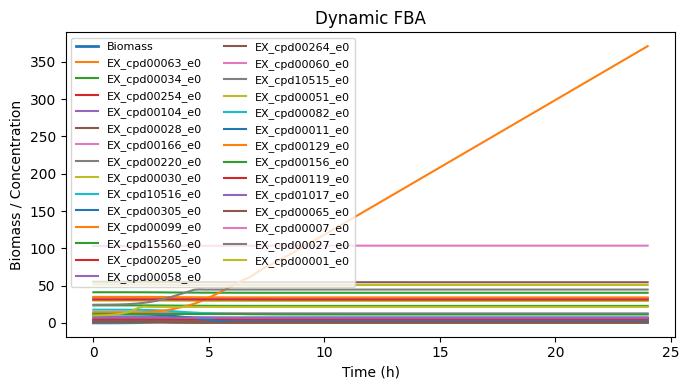

Target biomass = 6.4111
Depth 1: beam best factor 0.899
Depth 2: beam best factor 0.572
Best partners: ['GCF_964062795.1_Loigolactobacillus_coryniformis_CIRM-BIA2685_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063345.1_Pseudomonas_lini_CIRM-BIA2854_protein_gapfilled_noO2_appliedMedium.xml']
Best factor : 0.572
Growth Z    : 3.665


In [ ]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Beam-Search partner selection —— dynamic FBA (solve_ivp, corr-filter, GLPK)

· dFBA 逻辑与代码块 3 完全一致:
  • apply_env() + MAX_UPTAKE = 10
  • Pearson 相关性筛选 |r| > 0.5
  • μ → μ/μ0 归一化
  • 绘图: 单张图显示 Biomass + imports & exports 浓度曲线
· 仅额外实现: 多环境遍历、Beam-Search 组合搜索、内存释放
"""

import os, warnings, gc
from functools import lru_cache

import cobra
import numpy as np
import pandas as pd
import scipy.stats as sts
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

warnings.filterwarnings("ignore", category=UserWarning)
cobra.Configuration().solver = "glpk"

# ───────────── 全局参数 ─────────────
MODEL_DIR   = "models_gapfilled"
TARGET_FILE = "GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml"
ENV_FILE    = "environment_ball.tsv"

GROUP_SIZE, BEAM_WIDTH = 3, 5
TIME_SPAN, N_POINTS    = (0, 24), 100
INIT_BIOMASS           = 0.01
MAX_UPTAKE             = 10.0
UNBOUND                = 1000.0

# ───────────── apply_env ─────────────
def apply_env(model, env_dict, upper_bound=MAX_UPTAKE):
    """为给定 env_dict 设置 lb/ub，NaN/inf 视为 0。"""
    for rid, conc in env_dict.items():
        if conc is None or not np.isfinite(conc):
            conc = 0.0
        if model.reactions.has_id(rid):
            rxn = model.reactions.get_by_id(rid)
            rxn.lower_bound = -abs(conc)
            rxn.upper_bound = upper_bound
    return model.optimize()

# ───────── Pearson 相关性筛选 ─────────
def env_response_vector(model, env_ids, biomass_val):
    m = model.copy()
    bio = m.reactions.get_by_id('bio1')
    bio.lower_bound = bio.upper_bound = biomass_val
    sol = m.optimize()
    if sol.status != 'optimal':
        return np.zeros(len(env_ids))
    return np.array([sol.fluxes.get(r, 0.0) for r in env_ids])

def get_correlation(x, y):
    return 0.0 if np.allclose(y, y[0]) else sts.pearsonr(x, y)[0]

def select_exchange_import(model, env_dict, env_ids,
                           k=100, biomass_factor=0.01):
    base = model.copy()
    sol0 = base.optimize()
    if sol0.status != 'optimal' or sol0.objective_value == 0:
        return list(env_ids), []                      # fallback

    bspace = np.linspace(biomass_factor*sol0.objective_value,
                         sol0.objective_value, k)
    responses = np.array([env_response_vector(base, env_ids, b)
                          for b in bspace])
    corrs = np.array([get_correlation(bspace, responses[:, i])
                      for i in range(len(env_ids))])
    mask = np.abs(corrs) > 0.5
    selected = np.array(env_ids)[mask]
    if selected.size == 0:
        return list(env_ids), []
    resp_sel = responses[:, mask]
    imports  = selected[np.sum(resp_sel, axis=0) < 0].tolist() or list(env_ids)
    exports  = selected[np.sum(resp_sel, axis=0) >= 0].tolist()
    return imports, exports

# ───────────── 动态 FBA ──────────────
def avoid_zero_met(states, changes):
    ns = np.asarray(states) + np.asarray(changes)
    return np.where(ns < 0, -states, changes)

def get_growth(model, imports, exports, env_state, sol0):
    upt = {rid: env_state.get(rid, 0)/(env_state.get(rid, 0)+1)
           for rid in imports}
    sol = apply_env(model, upt)
    if sol.status != 'optimal':
        return 0.0, {r: 0.0 for r in imports+exports}
    mu = sol.objective_value
    flx = {r: sol.fluxes.get(r, 0.0) for r in imports+exports}
    return mu/sol0, flx

def dynamic_fba(model_orig, imports, exports, env_initial,
                init_bio, t_span, n_points,
                plot=False, plot_rxns=None):
    base    = model_orig.copy()
    sol0    = base.optimize().objective_value or 1e-9
    env_ids = imports + exports

    def ode(t, y):
        bio  = max(y[0], 0.0)
        mets = np.maximum(y[1:], 0.0)
        env  = dict(zip(env_ids, mets))
        mu, flx = get_growth(base, imports, exports, env, sol0)
        d_bio  = mu * bio
        d_mets = bio * np.array([flx[r] for r in env_ids])
        d_mets = avoid_zero_met(mets, d_mets)
        return np.concatenate(([d_bio], d_mets))

    y0 = np.concatenate(([init_bio],
                         [env_initial.get(r, 0) for r in env_ids]))
    sol = solve_ivp(ode, t_span, y0,
                    t_eval=np.linspace(*t_span, n_points))
    bio_vec = sol.y[0]

    if plot:
        env_mat = sol.y[1:].T
        time    = sol.t
        plt.figure(figsize=(7, 4))
        plt.plot(time, bio_vec, lw=2, label="Biomass")
        sel_rxns = plot_rxns or env_ids
        for rid in sel_rxns:
            idx = env_ids.index(rid)
            plt.plot(time, env_mat[:, idx], label=rid)
        plt.xlabel("Time (h)")
        plt.ylabel("Biomass / Concentration")
        plt.title("Dynamic FBA")
        plt.legend(ncol=2, fontsize=8)
        plt.tight_layout(); plt.show()

    return bio_vec

# ───────────── flux 支持集 ────────────
def flux_sets(model, env):
    tmp = model.copy()
    apply_env(tmp, {rid: env[rid]/(env[rid]+1) for rid in env})
    if tmp.optimize().status != 'optimal':
        return set(), set()
    upt = {rid for rid in env
           if tmp.reactions.has_id(rid)
           and tmp.reactions.get_by_id(rid).flux < 0}
    sec = {rid for rid in env
           if tmp.reactions.has_id(rid)
           and tmp.reactions.get_by_id(rid).flux > 0}
    return upt, sec

# ───────────── 读环境文件 ─────────────
env_tbl = pd.read_csv(ENV_FILE, sep="\t")
env_tbl["concentration"] = pd.to_numeric(
    env_tbl["concentration"], errors="coerce").fillna(0.0)

if "env_id" in env_tbl.columns:
    env_groups = {int(i): df for i, df in env_tbl.groupby("env_id")}
else:
    n_met = env_tbl["metabolite_id"].nunique()
    env_groups = {i: env_tbl.iloc[i*n_met:(i+1)*n_met]
                  for i in range(len(env_tbl)//n_met)}

partner_files = [f for f in os.listdir(MODEL_DIR)
                 if f.endswith(".xml") and f != TARGET_FILE]

# ────────────── 主程序 ───────────────
def main():
    for ENV_ID, env_df in sorted(env_groups.items()):
        print(f"\n===== Environment {ENV_ID} =====")
        env_dict = dict(zip(env_df["metabolite_id"], env_df["concentration"]))

        # —— 目标模型 (绘图) ——
        target = cobra.io.read_sbml_model(os.path.join(MODEL_DIR, TARGET_FILE))
        imports_t, exports_t = select_exchange_import(
            target, env_dict, list(env_dict))
        bio_t = dynamic_fba(target, imports_t, exports_t, env_dict,
                            INIT_BIOMASS, TIME_SPAN, N_POINTS,
                            plot=True)
        BASE_BIO = bio_t[-1]
        print(f"Target biomass = {BASE_BIO:.4f}")
        if BASE_BIO == 0:
            del target
            continue

        # —— 伴生模型预处理 ——
        partners = {}
        for fn in partner_files:
            mdl = cobra.io.read_sbml_model(os.path.join(MODEL_DIR, fn))
            imp_p, exp_p = select_exchange_import(
                mdl, env_dict, list(env_dict))
            bio_p = dynamic_fba(mdl, imp_p, exp_p, env_dict,
                                INIT_BIOMASS, TIME_SPAN, N_POINTS)
            cons, secs = flux_sets(mdl, env_dict)
            partners[fn] = {"consumes": cons, "secretes": secs,
                            "bio": bio_p[-1]}
            del mdl

        target_cons, _ = flux_sets(target, env_dict)

        @lru_cache(None)
        def eval_combo(combo):
            common   = target_cons.intersection(
                *[partners[p]["consumes"] for p in combo])
            secreted = set().union(
                *[partners[p]["secretes"] for p in combo])

            denom   = BASE_BIO + sum(partners[p]["bio"] for p in combo) or 1e-9
            new_env = env_dict.copy()
            for rid in common:
                new_env[rid] = env_dict[rid] / denom
            for rid in secreted:
                new_env[rid] = UNBOUND

            # —— 使用初始 imports_t / exports_t，不再重新筛选 ——
            bio_z = dynamic_fba(target, imports_t, exports_t, new_env,
                                INIT_BIOMASS, TIME_SPAN, N_POINTS)
            z = bio_z[-1]
            return z, z / BASE_BIO if BASE_BIO else 0.0

        # —— Beam-Search ——
        best_combo, best_fac = None, -np.inf
        beam = [()]
        for depth in range(1, GROUP_SIZE):
            cand = []
            for combo in beam:
                used = set(combo)
                for p in partners:
                    if p in used:
                        continue
                    nc = tuple(sorted(combo + (p,)))
                    z, fac = eval_combo(nc)
                    cand.append((nc, fac))
                    if len(nc) == GROUP_SIZE-1 and fac > best_fac:
                        best_combo, best_fac = nc, fac
            cand.sort(key=lambda x: x[1], reverse=True)
            beam = [c for c, _ in cand[:BEAM_WIDTH]]
            if cand:
                print(f"Depth {depth}: beam best factor {cand[0][1]:.3f}")

        # —— 输出结果 ——
        if best_combo:
            print("Best partners:", list(best_combo))
            print(f"Best factor : {best_fac:.3f}")
            print(f"Growth Z    : {best_fac * BASE_BIO:.3f}")
        else:
            print("No feasible partner combo.")

        del target, partners
        gc.collect()

if __name__ == "__main__":
    main()



================ Environment 0 ================
-- Group 0 -- models: ['GCA_964062575.1_Lactococcus_lactis_CIRM-BIA2698_genomic_gapfilled_noO2_appliedMedium.xml', 'GCA_964063365.1_Rahnella_aquatiliss_CIRM-BIA2795_genomic_gapfilled_noO2_appliedMedium.xml', 'GCA_964063435.1_Leuconostoc_mesenteroides_FME302_genomic_gapfilled_noO2_appliedMedium.xml']
   GCA_964062575.1_Lactococcus_lactis_CIRM-BIA2698_genomic_gapfilled_noO2_appliedMedium.xml final biomass =   2.1107


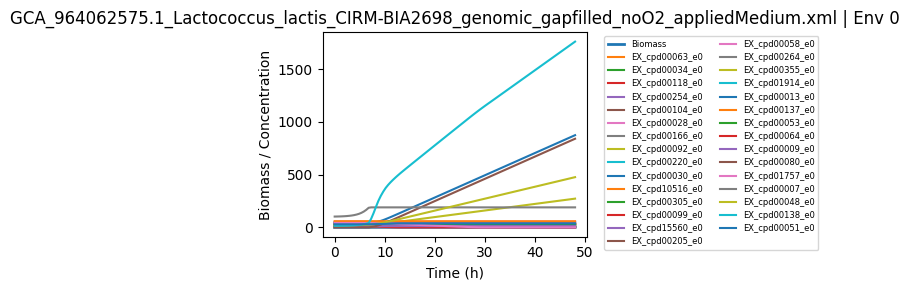

   GCA_964063365.1_Rahnella_aquatiliss_CIRM-BIA2795_genomic_gapfilled_noO2_appliedMedium.xml final biomass =   3.5898


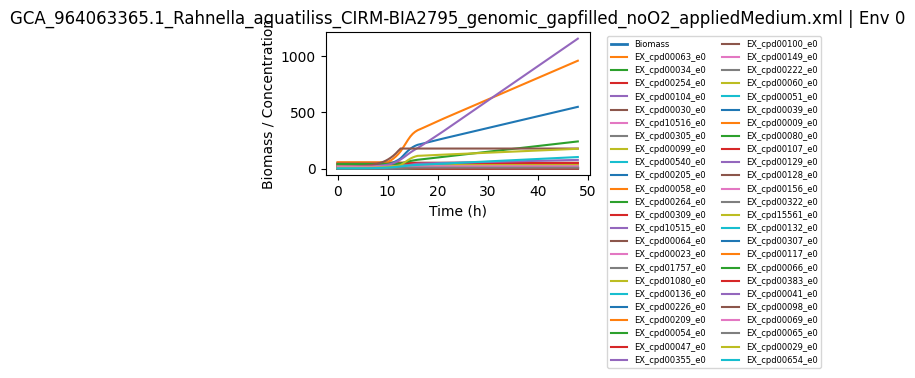

   GCA_964063435.1_Leuconostoc_mesenteroides_FME302_genomic_gapfilled_noO2_appliedMedium.xml final biomass =   2.1169


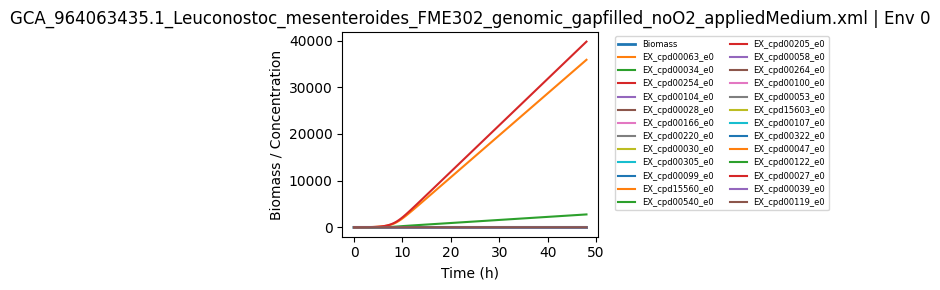

-- Group 1 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964060345.1_Lentilactobacillus_buchneri_CIRM-BIA1514_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062525.1_Enterococcus_gilvus_CIRM-BIA2700_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4111


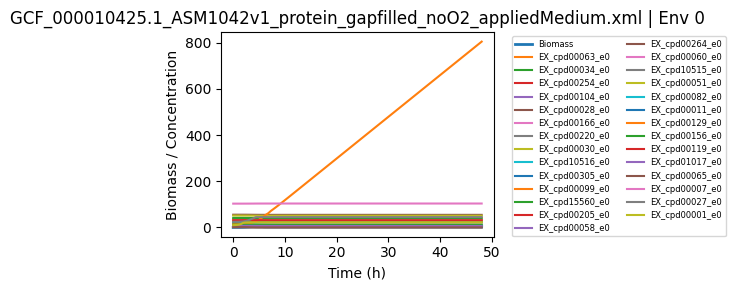

   GCF_964060345.1_Lentilactobacillus_buchneri_CIRM-BIA1514_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.8932


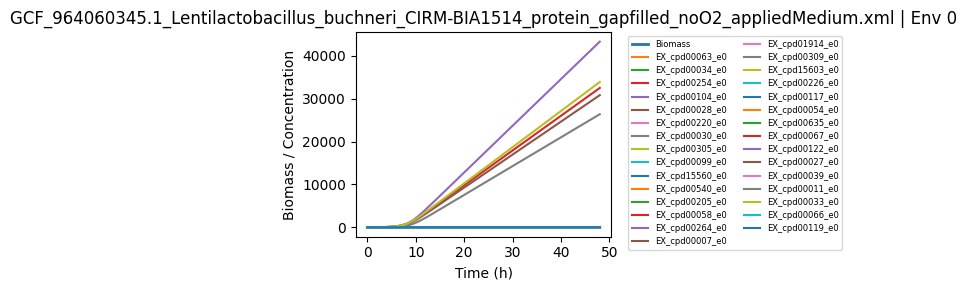

   GCF_964062525.1_Enterococcus_gilvus_CIRM-BIA2700_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.2886


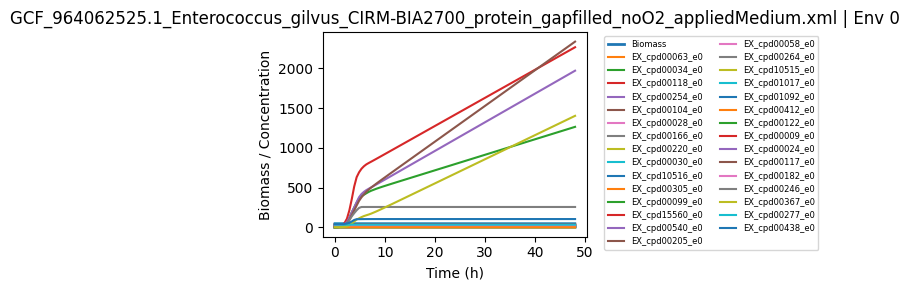

-- Group 2 -- models: ['GCF_964062605.1_Lentilactobacillus_kefiri_CIRM-BIA2556_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062635.1_Pediococcus_ethanolidurans_CIRM-BIA2669_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062735.1_Lentilactobacillus_parabuchneri_CIRM-BIA2637_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964062605.1_Lentilactobacillus_kefiri_CIRM-BIA2556_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.0401


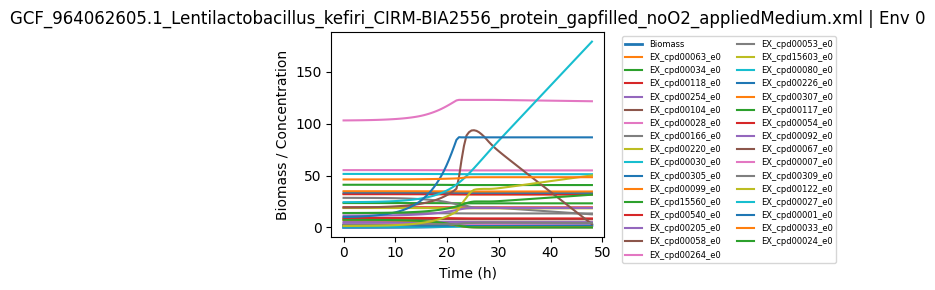

   GCF_964062635.1_Pediococcus_ethanolidurans_CIRM-BIA2669_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.1360


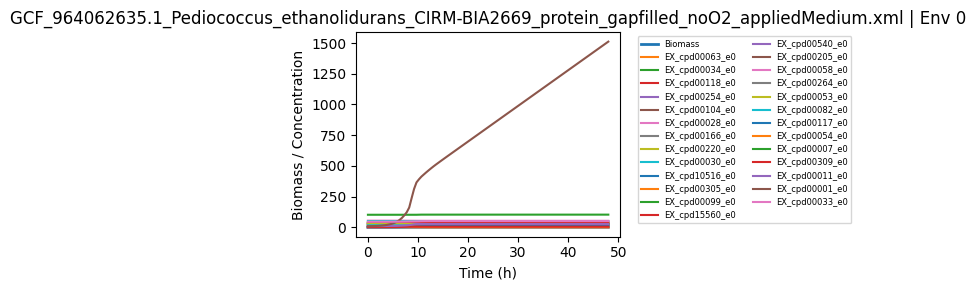

   GCF_964062735.1_Lentilactobacillus_parabuchneri_CIRM-BIA2637_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.5903


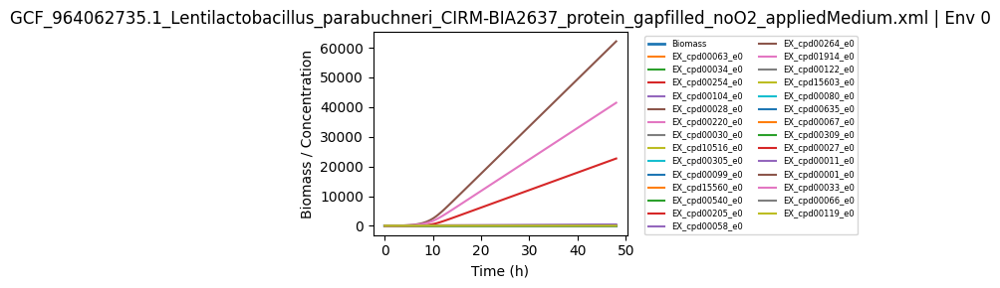

-- Group 3 -- models: ['GCF_964062745.1_Levilactobacillus_cerevisiae_CIRM-BIA2671_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062795.1_Loigolactobacillus_coryniformis_CIRM-BIA2685_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062975.1_Lactococcus_lactis_CIRM-BIA2553_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964062745.1_Levilactobacillus_cerevisiae_CIRM-BIA2671_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.0651


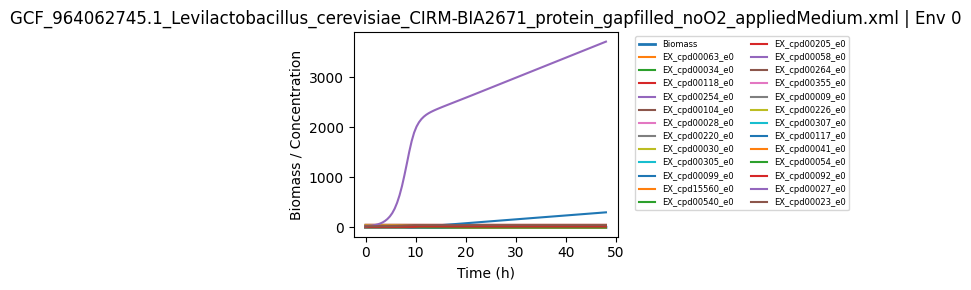

   GCF_964062795.1_Loigolactobacillus_coryniformis_CIRM-BIA2685_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.4903


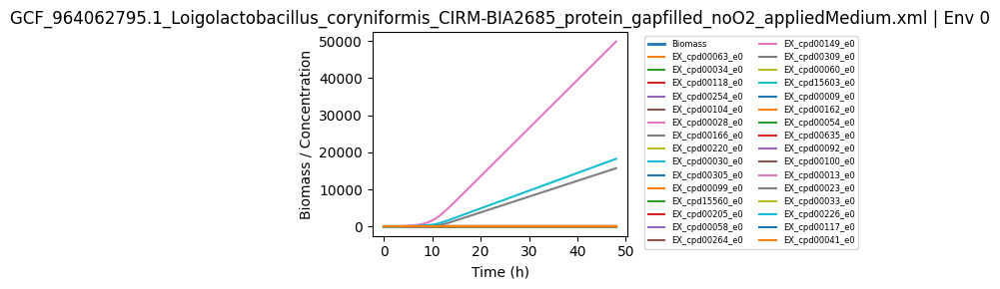

   GCF_964062975.1_Lactococcus_lactis_CIRM-BIA2553_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.1080


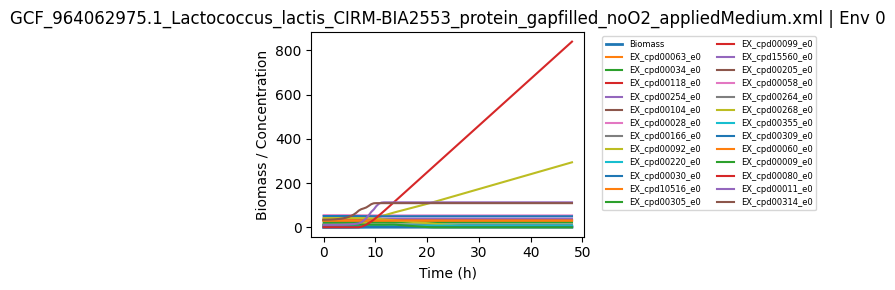

-- Group 4 -- models: ['GCF_964063155.1_Pediococcus_parvulus_IOEB-9646_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063315.1_Leuconostoc_carnosum_CIRM-BIA2809_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063325.1_Hafnia_alvei_CIRM-BIA2718_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964063155.1_Pediococcus_parvulus_IOEB-9646_protein_gapfilled_noO2_appliedMedium.xml final biomass =   3.8205


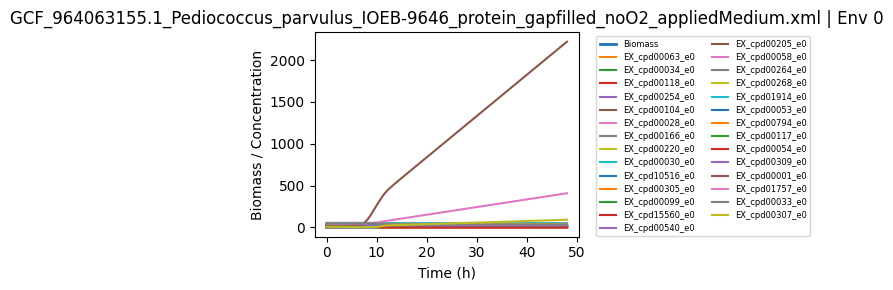

   GCF_964063315.1_Leuconostoc_carnosum_CIRM-BIA2809_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.6219


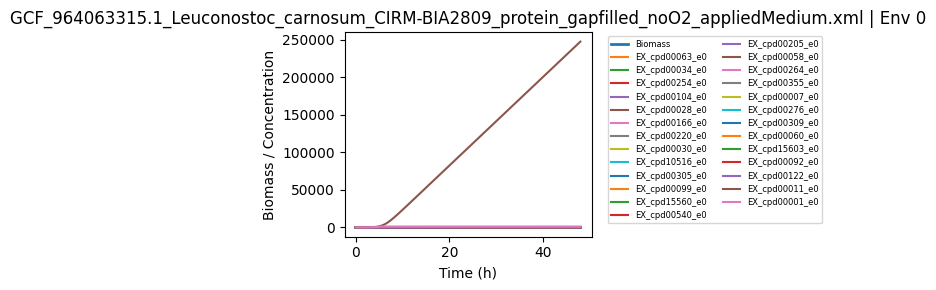

   GCF_964063325.1_Hafnia_alvei_CIRM-BIA2718_protein_gapfilled_noO2_appliedMedium.xml final biomass =   3.5644


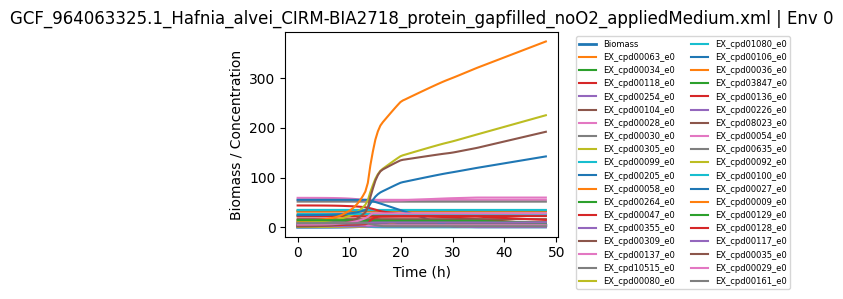

-- Group 5 -- models: ['GCF_964063345.1_Pseudomonas_lini_CIRM-BIA2854_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063355.1_Latilactobacillus_curvatus_CIRM-BIA2781_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063375.1_Bacillus_pumilus_CIRM-BIA2784_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964063345.1_Pseudomonas_lini_CIRM-BIA2854_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.0177


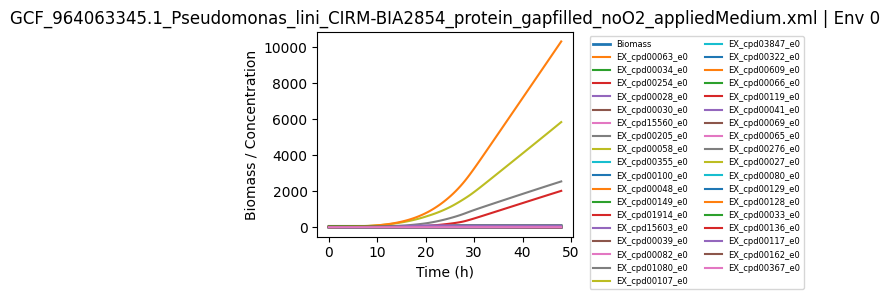

   GCF_964063355.1_Latilactobacillus_curvatus_CIRM-BIA2781_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.1238


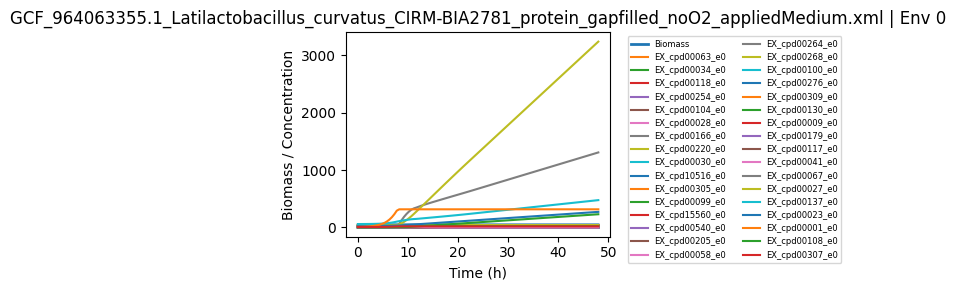

   GCF_964063375.1_Bacillus_pumilus_CIRM-BIA2784_protein_gapfilled_noO2_appliedMedium.xml final biomass =   3.6357


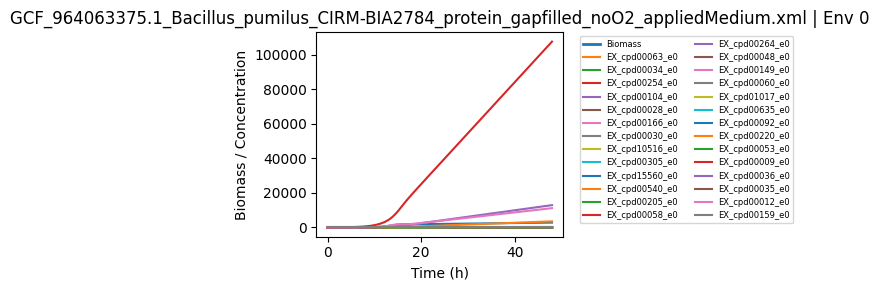

-- Group 6 -- models: ['GCF_964063385.1_Latilactobacillus_curvatus_J116_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063395.1_Pediococcus_parvulus_F2-sp2-RGJ_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063405.1_Leuconostoc_mesenteroides_FLEC04_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964063385.1_Latilactobacillus_curvatus_J116_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.1444


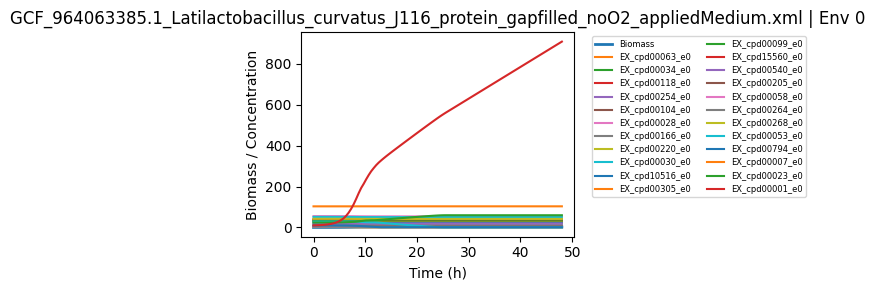

   GCF_964063395.1_Pediococcus_parvulus_F2-sp2-RGJ_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.5966


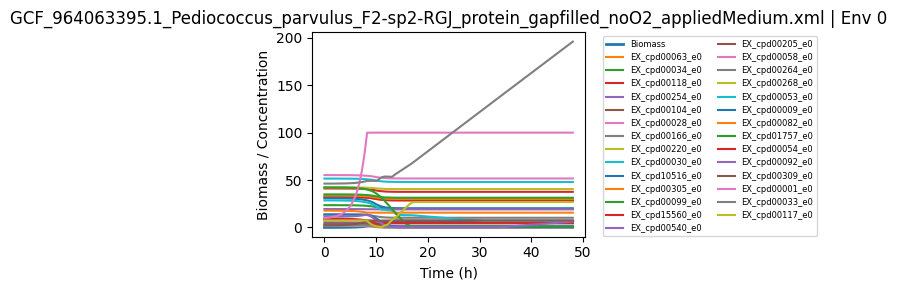

   GCF_964063405.1_Leuconostoc_mesenteroides_FLEC04_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.4291


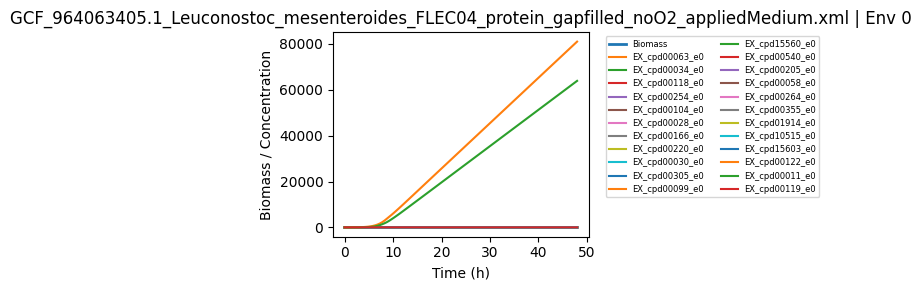

-- Group 7 -- models: ['GCF_964063415.1_Latilactobacillus_sakei_J33_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063425.1_Lactiplantibacillus_pentosus_CNRZ1547_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063445.1_Pediococcus_parvulus_IOEB-8801_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964063415.1_Latilactobacillus_sakei_J33_protein_gapfilled_noO2_appliedMedium.xml final biomass =   4.5237


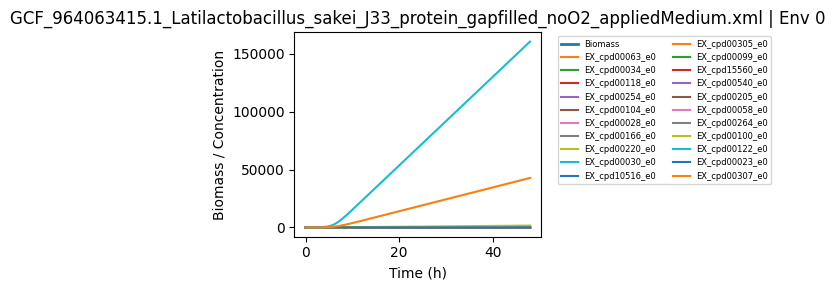

   GCF_964063425.1_Lactiplantibacillus_pentosus_CNRZ1547_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.0493


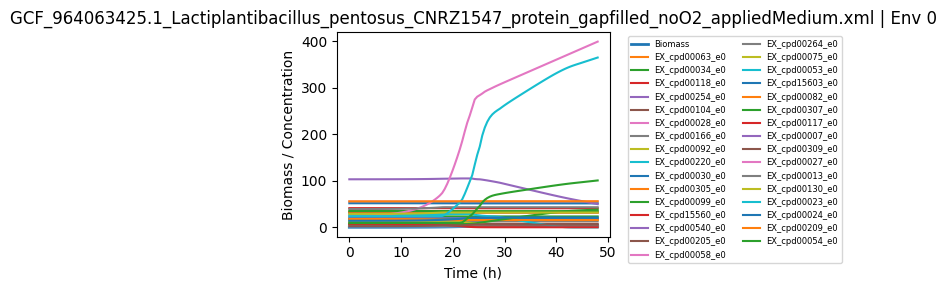

   GCF_964063445.1_Pediococcus_parvulus_IOEB-8801_protein_gapfilled_noO2_appliedMedium.xml final biomass =   3.8847


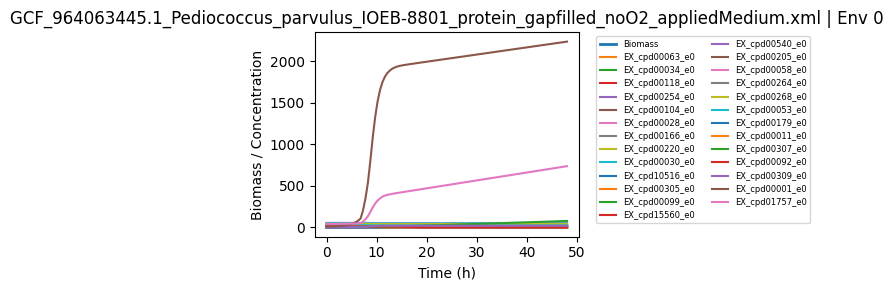

-- Group 8 -- models: ['GCF_964063755.1_Latilactobacillus_sakei_CIRM-BIA1912_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065095.1_Lentilactobacillus_buchneri_CIRM-BIA2511_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065115.1_Levilactobacillus_brevis_CIRM-BIA2515_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964063755.1_Latilactobacillus_sakei_CIRM-BIA1912_protein_gapfilled_noO2_appliedMedium.xml final biomass =   4.4964


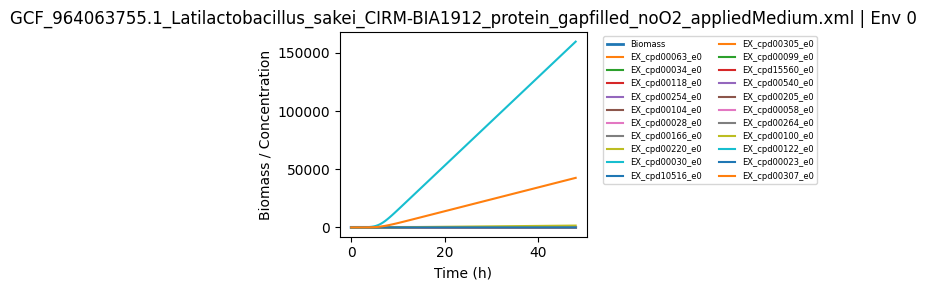

   GCF_964065095.1_Lentilactobacillus_buchneri_CIRM-BIA2511_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.9103


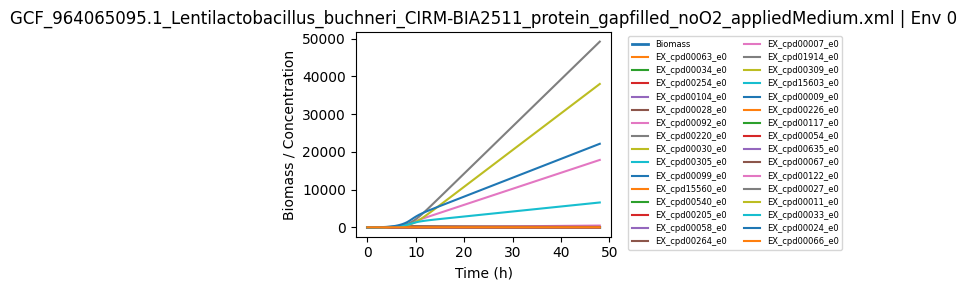

   GCF_964065115.1_Levilactobacillus_brevis_CIRM-BIA2515_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.5948


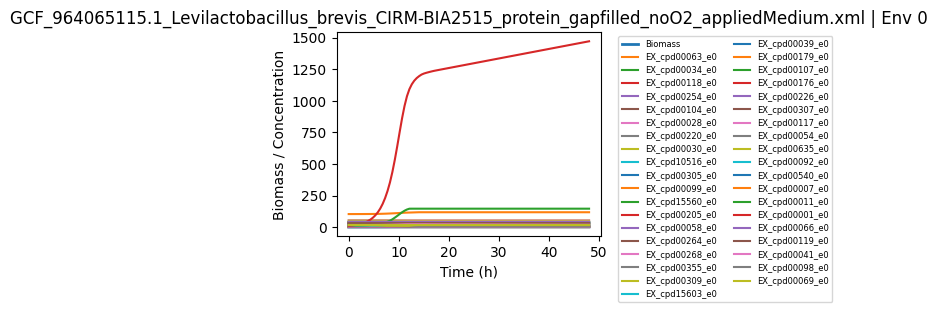

-- Group 9 -- models: ['GCF_964065165.1_Levilactobacillus_yonginensis_CIRM-BIA2544_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065205.1_Lacticaseibacillus_paracasei_CIRM-BIA2373_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065235.1_Leuconostoc_pseudomesenteroides_CIRM-BIA2446_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964065165.1_Levilactobacillus_yonginensis_CIRM-BIA2544_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.1173


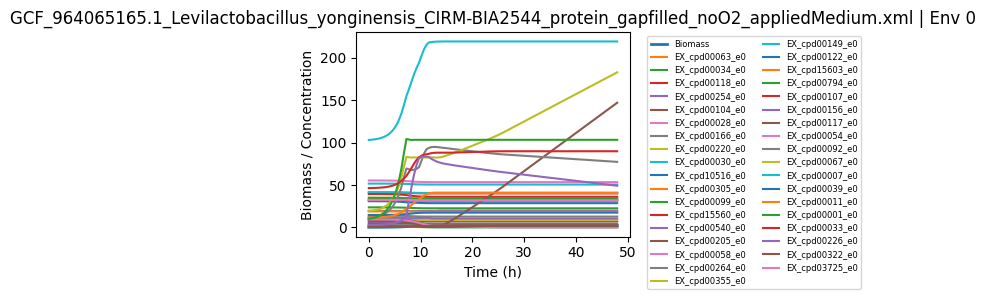

   GCF_964065205.1_Lacticaseibacillus_paracasei_CIRM-BIA2373_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.1213


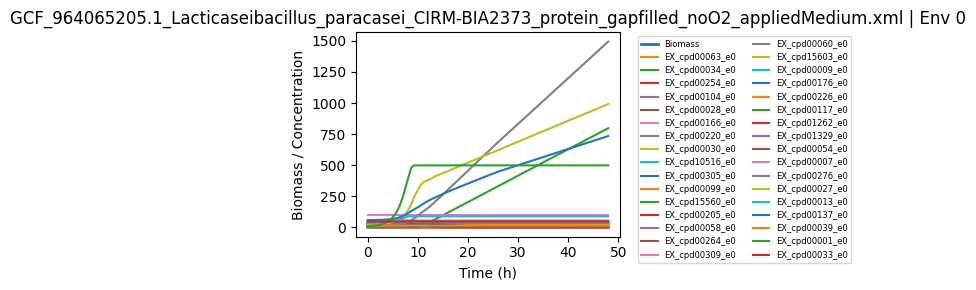

   GCF_964065235.1_Leuconostoc_pseudomesenteroides_CIRM-BIA2446_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.1190


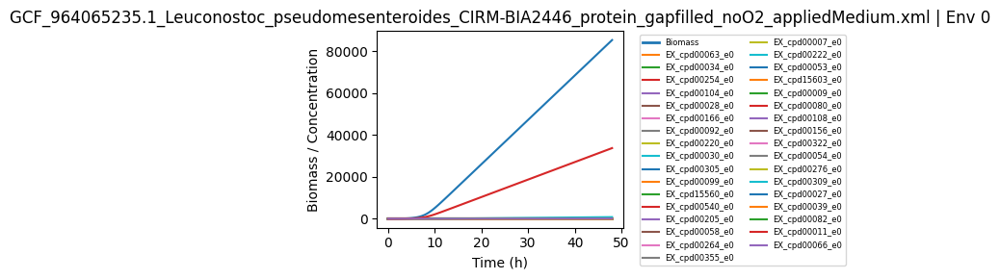

-- Group 10 -- models: ['GCF_964065245.1_Lactiplantibacillus_plantarum_CIRM-BIA2443_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065285.1_Levilactobacillus_brevis_CIRM-BIA2444_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065435.1_Pediococcus_parvulus_CIRM-BIA2501_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964065245.1_Lactiplantibacillus_plantarum_CIRM-BIA2443_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.0362


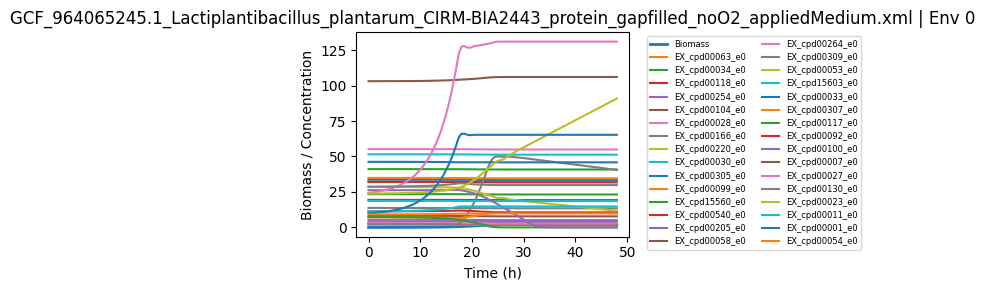

   GCF_964065285.1_Levilactobacillus_brevis_CIRM-BIA2444_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.1211


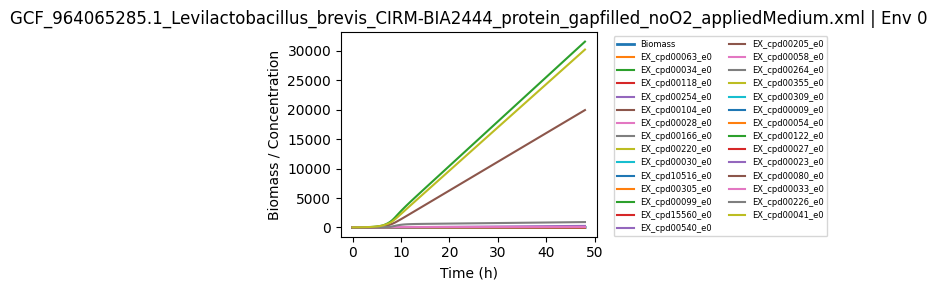

   GCF_964065435.1_Pediococcus_parvulus_CIRM-BIA2501_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.5387


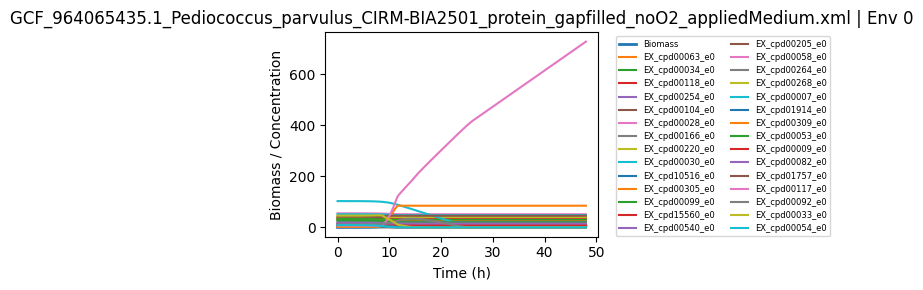

-- Group 11 -- models: ['GCF_964065445.1_Lactiplantibacillus_plantarum_CIRM-BIA2453_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065465.1_Liquorilactobacillus_satsumensis_CIRM-BIA2521_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964068245.1_Lentilactobacillus_kefiri_CIRM-BIA2539_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964065445.1_Lactiplantibacillus_plantarum_CIRM-BIA2453_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.0353


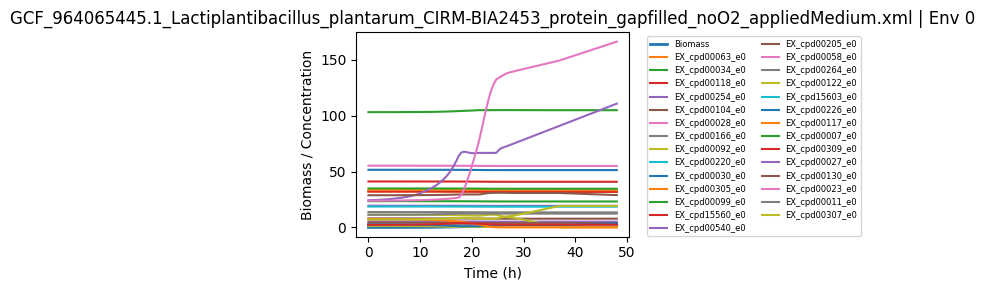

   GCF_964065465.1_Liquorilactobacillus_satsumensis_CIRM-BIA2521_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.1200


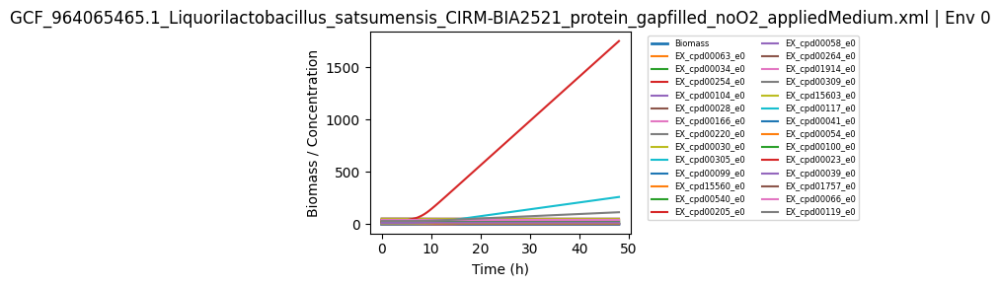

   GCF_964068245.1_Lentilactobacillus_kefiri_CIRM-BIA2539_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.0361


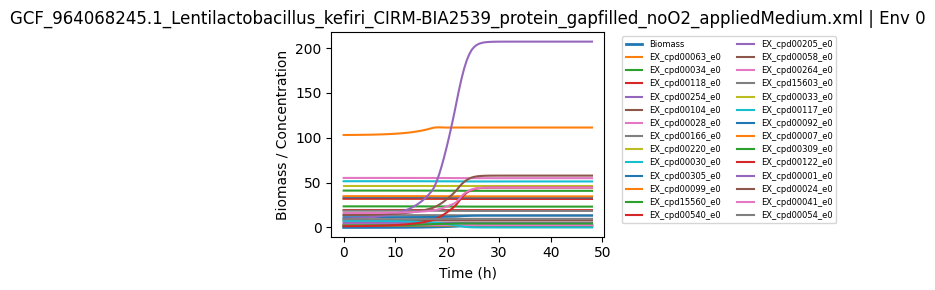

-- Group 12 -- models: ['GCF_964069135.1_Schleiferilactobacillus_harbinensis_CIRM-BIA2388_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964084875.1_Leuconostoc_carnosum_A1b-VegA_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964084915.1_Lactiplantibacillus_plantarum_ATCC14431_protein_gapfilled_noO2_appliedMedium.xml']
   GCF_964069135.1_Schleiferilactobacillus_harbinensis_CIRM-BIA2388_protein_gapfilled_noO2_appliedMedium.xml final biomass =  25.7108


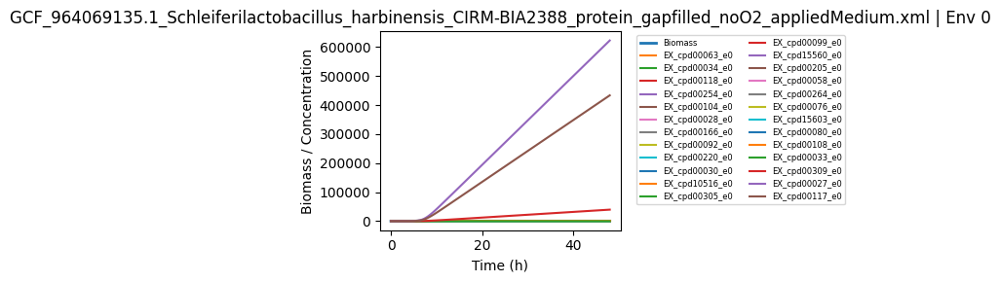

   GCF_964084875.1_Leuconostoc_carnosum_A1b-VegA_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.7164


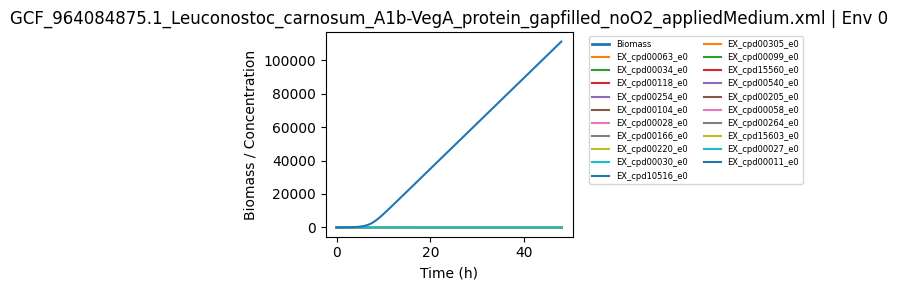

   GCF_964084915.1_Lactiplantibacillus_plantarum_ATCC14431_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.0378


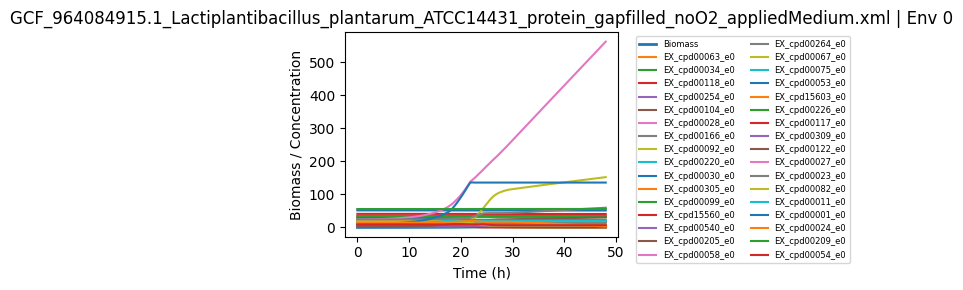

In [ ]:
# -*- coding: utf-8 -*-
"""
Notebook‑friendly multi‑model dynamic FBA runner
==============================================

* 从 *代码块 1* 保留核心函数与 GLPK 配置。
* 去掉 `argparse`，改用 **参数区**手动设定路径、批量大小等，适合在 Jupyter / Colab 直接运行。
* 在每个环境中，按 `BATCH_SIZE` 将模型划分为若干 *组*，对每组成员同时做 dFBA：
  * **即时绘图**——只 `plt.show()` 不存 PDF。
  * **结果打印**——输出 *环境编号 → 组编号 → 每个模型* 的终点 Biomass。

使用方法
---------
1. 把本代码块粘到 Notebook 单元并执行。
2. 若需修改目录、时间区间、批量大小，直接改顶部 **参数区**常量即可。
"""

from __future__ import annotations

# ─────────────────── 参数区（按需修改） ────────────────────
MODEL_DIR   = "models_gapfilled"      # 模型文件夹
TARGET_FILE = None                     # 若要排除某个目标模型，可填文件名，否则 None
ENV_FILE    = "environment_ball.tsv"  # environment_ball 文件路径
BATCH_SIZE  = 3                        # 每组模型数量 n
TIME_SPAN   = (0, 48)                 # 动态 FBA 时间范围 (h)
N_POINTS    = 100                      # 求解时间点个数
INIT_BIOMASS = 0.01
MAX_UPTAKE   = 10.0
UNBOUND_CONC = 1e3

# ──────────────────── 库 & 基础函数 ─────────────────────
import gc
import math
import os
from itertools import islice
from pathlib import Path

import cobra
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.integrate import solve_ivp
from scipy.stats import pearsonr

cobra.Configuration().solver = "glpk"


def apply_env(model: cobra.Model, env: dict[str, float], upper_bound: float = MAX_UPTAKE):
    """设置交换反应边界并优化模型。"""
    for rid, conc in env.items():
        if model.reactions.has_id(rid):
            rxn = model.reactions.get_by_id(rid)
            rxn.lower_bound = -abs(conc)
            rxn.upper_bound = upper_bound
    return model.optimize()


def env_response_vector(model: cobra.Model, env_ids: list[str], biomass_val: float):
    m = model.copy()
    bio = m.reactions.get_by_id("bio1")
    bio.lower_bound = bio.upper_bound = biomass_val
    sol = m.optimize()
    if sol.status != "optimal":
        return np.zeros(len(env_ids))
    return np.array([sol.fluxes.get(r, 0.0) for r in env_ids])


def get_correlation(x: np.ndarray, y: np.ndarray) -> float:
    return 0.0 if np.allclose(y, y[0]) else pearsonr(x, y)[0]


def select_exchange_import(model: cobra.Model, env: dict[str, float], env_ids: list[str],
                           k: int = 100, biomass_factor: float = 0.01):
    base = model.copy()
    sol0 = base.optimize()
    if sol0.status != "optimal" or sol0.objective_value == 0:
        return env_ids, []

    bspace = np.linspace(biomass_factor * sol0.objective_value,
                         sol0.objective_value, k)
    responses = np.array([env_response_vector(base, env_ids, b) for b in bspace])
    corrs = np.array([get_correlation(bspace, responses[:, i]) for i in range(len(env_ids))])
    mask = np.abs(corrs) > 0.5
    selected = np.array(env_ids)[mask]
    if selected.size == 0:
        return env_ids, []
    resp_sel = responses[:, mask]
    imports = selected[np.sum(resp_sel, axis=0) < 0].tolist() or env_ids
    exports = selected[np.sum(resp_sel, axis=0) >= 0].tolist()
    return imports, exports


def avoid_zero_met(states: np.ndarray, changes: np.ndarray) -> np.ndarray:
    ns = states + changes
    return np.where(ns < 0, -states, changes)


def get_growth(model: cobra.Model, imports: list[str], exports: list[str],
               env_state: dict[str, float], sol0: float):
    uptake_bounds = {rid: env_state.get(rid, 0.0) / (env_state.get(rid, 0.0) + 1.0)
                     for rid in imports}
    sol = apply_env(model, uptake_bounds)
    if sol.status != "optimal":
        return 0.0, {r: 0.0 for r in imports + exports}
    mu = sol.objective_value
    return mu / sol0, {r: sol.fluxes.get(r, 0.0) for r in imports + exports}


def simulate(model_orig: cobra.Model, imports: list[str], exports: list[str],
             env_initial: dict[str, float],
             t_span: tuple[float, float], n_points: int = N_POINTS,
             init_biomass: float = INIT_BIOMASS):
    base = model_orig.copy()
    sol0 = base.optimize().objective_value or 1e-9
    env_ids = imports + exports

    def ode(t, y):
        biomass = max(y[0], 0.0)
        mets = np.maximum(y[1:], 0.0)
        env_state = dict(zip(env_ids, mets))
        mu, fluxes = get_growth(base, imports, exports, env_state, sol0)
        d_biomass = mu * biomass
        d_mets = biomass * np.array([fluxes[r] for r in env_ids])
        d_mets = avoid_zero_met(mets, d_mets)
        return np.concatenate(([d_biomass], d_mets))

    y0 = np.concatenate(([init_biomass], [env_initial.get(r, 0.0) for r in env_ids]))
    return solve_ivp(ode, t_span, y0, t_eval=np.linspace(*t_span, n_points))

# ─────────────────── 环境与模型加载 ───────────────────────

def load_environment_ball(path: str | Path):
    tbl = pd.read_csv(path, sep="\t")
    tbl["concentration"] = pd.to_numeric(tbl["concentration"], errors="coerce").fillna(0.0)

    if "env_id" in tbl.columns:
        for _, g in tbl.groupby("env_id"):
            yield dict(zip(g["metabolite_id"], g["concentration"]))
    else:
        n_met = tbl["metabolite_id"].nunique()
        for i in range(len(tbl) // n_met):
            chunk = tbl.iloc[i * n_met : (i + 1) * n_met]
            yield dict(zip(chunk["metabolite_id"], chunk["concentration"]))


def iter_model_paths(model_dir: str | Path, exclude: str | None = None):
    for fn in sorted(Path(model_dir).glob("*.xml")):
        if exclude and fn.name == exclude:
            continue
        yield fn

# ─────────────────── 主流程 ──────────────────────────────

def run_batch(model_paths: list[Path], env: dict[str, float]):
    """对单个 *模型组* (≤ BATCH_SIZE) 进行模拟并返回结果"""
    results = {}
    for mp in model_paths:
        mdl = cobra.io.read_sbml_model(mp)
        imports, exports = select_exchange_import(mdl, env, list(env))
        sol = simulate(mdl, imports, exports, env, TIME_SPAN, N_POINTS)
        results[mp.name] = {"solution": sol, "imports": imports, "exports": exports}
        del mdl; gc.collect()
    return results


def plot_result(name: str, sol, env_ids):
    plt.figure(figsize=(6, 3))
    plt.plot(sol.t, sol.y[0], lw=2, label="Biomass")
    for idx, rid in enumerate(env_ids):
        plt.plot(sol.t, sol.y[idx + 1], label=rid)
    plt.title(name)
    plt.xlabel("Time (h)")
    plt.ylabel("Biomass / Concentration")
    plt.legend(ncol=2, fontsize=6, bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()


def run_all():
    """遍历所有环境 & 模型组并输出/绘图。"""
    model_paths = list(iter_model_paths(MODEL_DIR, exclude=TARGET_FILE))
    envs = list(load_environment_ball(ENV_FILE))
    if not envs:
        raise RuntimeError("环境文件为空或解析失败！")

    for env_id, env in enumerate(envs):
        print(f"\n================ Environment {env_id} ================")
        for idx in range(0, len(model_paths), BATCH_SIZE):
            batch = model_paths[idx : idx + BATCH_SIZE]
            group_id = idx // BATCH_SIZE
            print(f"-- Group {group_id} -- models: {[p.name for p in batch]}")
            res = run_batch(batch, env)
            for name, d in res.items():
                final_bio = d["solution"].y[0, -1]
                print(f"   {name:<40} final biomass = {final_bio:>8.4f}")
                env_ids = d["imports"] + d["exports"]
                plot_result(f"{name} | Env {env_id}", d["solution"], env_ids)


# 运行
run_all()



================ Environment 0 ================
-- Group 0 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCA_964062575.1_Lactococcus_lactis_CIRM-BIA2698_genomic_gapfilled_noO2_appliedMedium.xml', 'GCA_964063365.1_Rahnella_aquatiliss_CIRM-BIA2795_genomic_gapfilled_noO2_appliedMedium.xml']


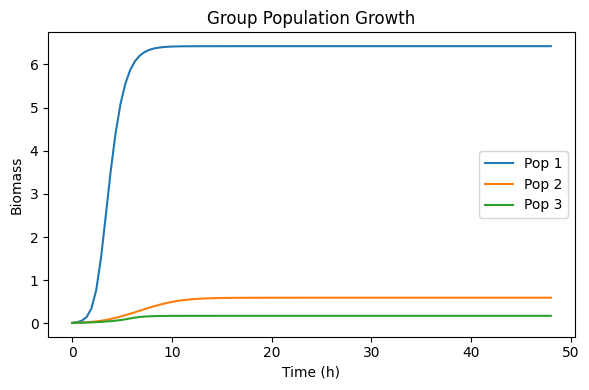

<ipython-input-14-cb36d97f3526>:98: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.legend(ncol=2, fontsize=7); plt.tight_layout(); plt.show()


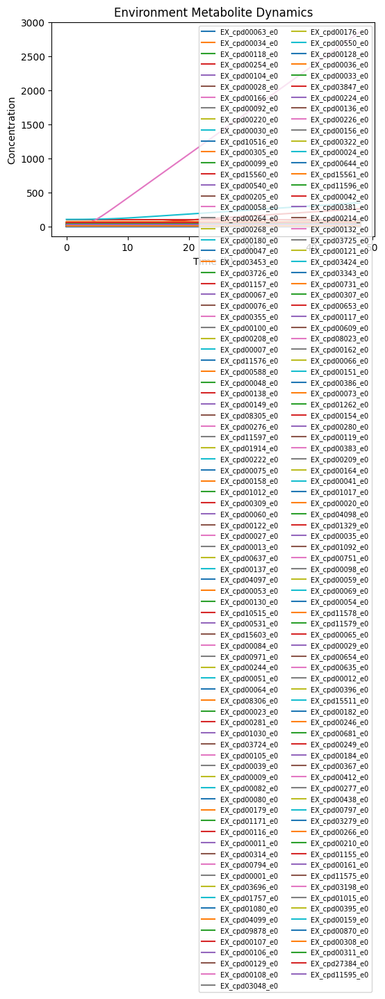

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4239
   GCA_964062575.1_Lactococcus_lactis_CIRM-BIA2698_genomic_gapfilled_noO2_appliedMedium.xml final biomass =   0.5935
   GCA_964063365.1_Rahnella_aquatiliss_CIRM-BIA2795_genomic_gapfilled_noO2_appliedMedium.xml final biomass =   0.1736
-- Group 1 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCA_964063435.1_Leuconostoc_mesenteroides_FME302_genomic_gapfilled_noO2_appliedMedium.xml', 'GCF_964060345.1_Lentilactobacillus_buchneri_CIRM-BIA1514_protein_gapfilled_noO2_appliedMedium.xml']


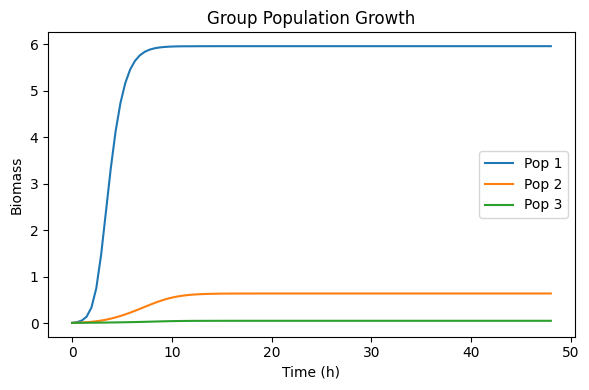

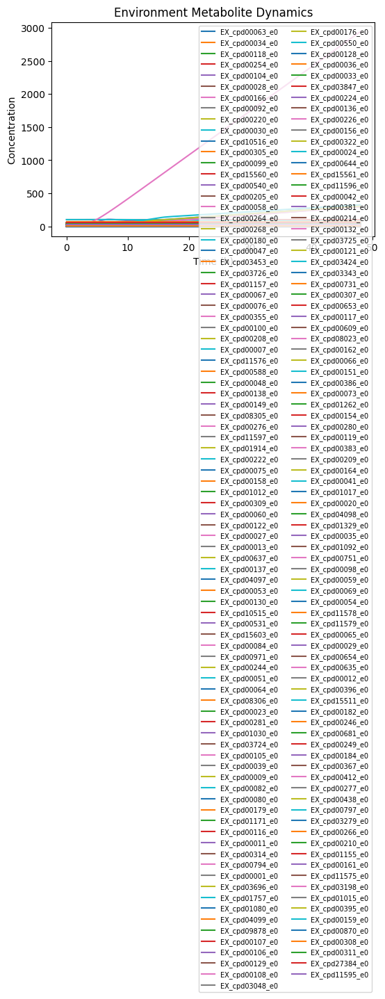

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   5.9549
   GCA_964063435.1_Leuconostoc_mesenteroides_FME302_genomic_gapfilled_noO2_appliedMedium.xml final biomass =   0.6417
   GCF_964060345.1_Lentilactobacillus_buchneri_CIRM-BIA1514_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.0549
-- Group 2 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062525.1_Enterococcus_gilvus_CIRM-BIA2700_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062605.1_Lentilactobacillus_kefiri_CIRM-BIA2556_protein_gapfilled_noO2_appliedMedium.xml']


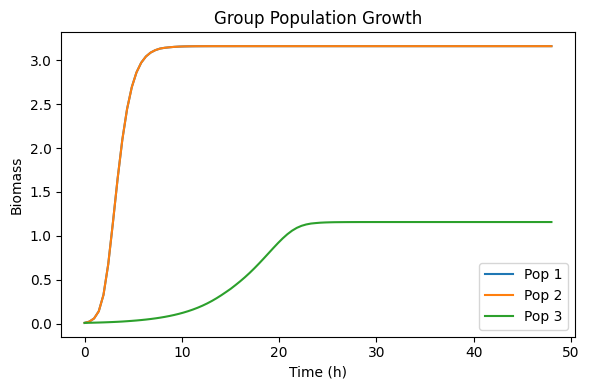

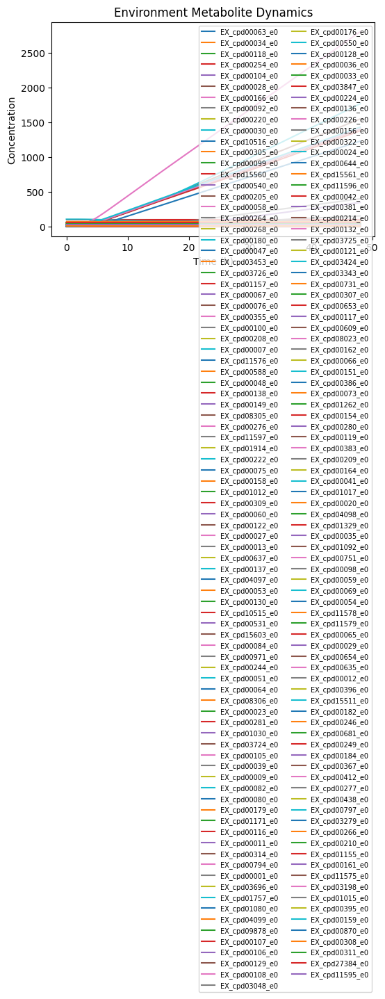

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   3.1600
   GCF_964062525.1_Enterococcus_gilvus_CIRM-BIA2700_protein_gapfilled_noO2_appliedMedium.xml final biomass =   3.1600
   GCF_964062605.1_Lentilactobacillus_kefiri_CIRM-BIA2556_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.1581
-- Group 3 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062635.1_Pediococcus_ethanolidurans_CIRM-BIA2669_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062735.1_Lentilactobacillus_parabuchneri_CIRM-BIA2637_protein_gapfilled_noO2_appliedMedium.xml']


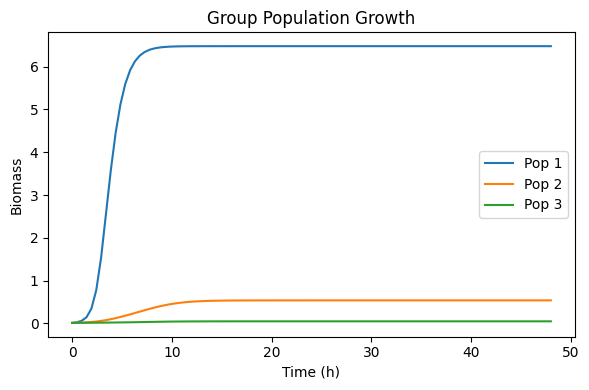

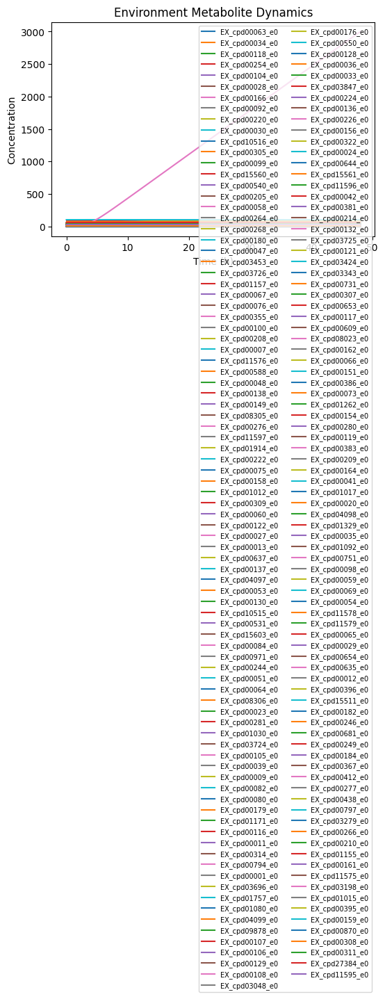

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4798
   GCF_964062635.1_Pediococcus_ethanolidurans_CIRM-BIA2669_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.5363
   GCF_964062735.1_Lentilactobacillus_parabuchneri_CIRM-BIA2637_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.0464
-- Group 4 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062745.1_Levilactobacillus_cerevisiae_CIRM-BIA2671_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062795.1_Loigolactobacillus_coryniformis_CIRM-BIA2685_protein_gapfilled_noO2_appliedMedium.xml']


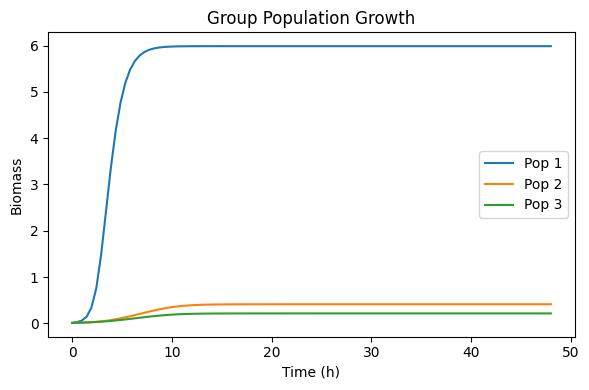

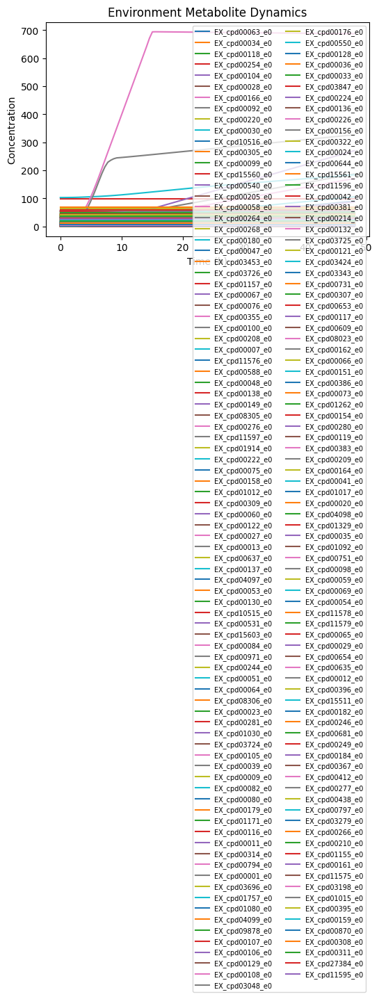

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   5.9870
   GCF_964062745.1_Levilactobacillus_cerevisiae_CIRM-BIA2671_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.4125
   GCF_964062795.1_Loigolactobacillus_coryniformis_CIRM-BIA2685_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.2147
-- Group 5 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964062975.1_Lactococcus_lactis_CIRM-BIA2553_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063155.1_Pediococcus_parvulus_IOEB-9646_protein_gapfilled_noO2_appliedMedium.xml']


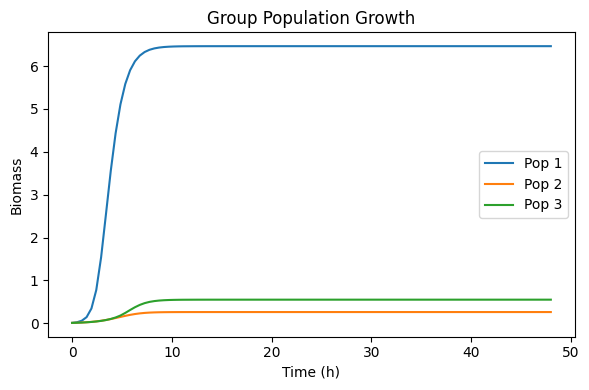

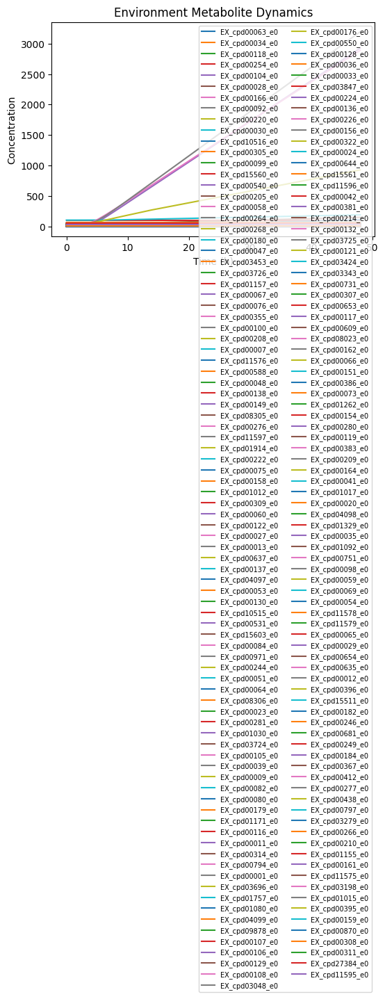

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4635
   GCF_964062975.1_Lactococcus_lactis_CIRM-BIA2553_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.2626
   GCF_964063155.1_Pediococcus_parvulus_IOEB-9646_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.5515
-- Group 6 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063315.1_Leuconostoc_carnosum_CIRM-BIA2809_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063325.1_Hafnia_alvei_CIRM-BIA2718_protein_gapfilled_noO2_appliedMedium.xml']


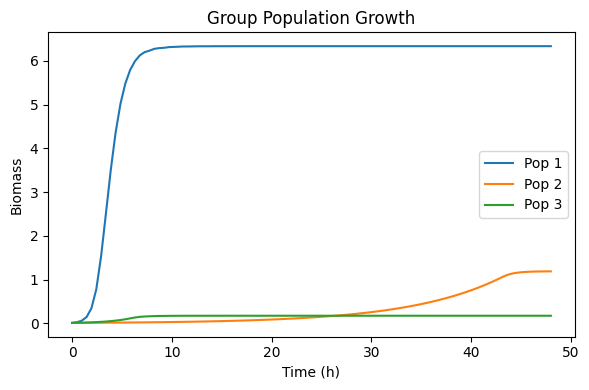

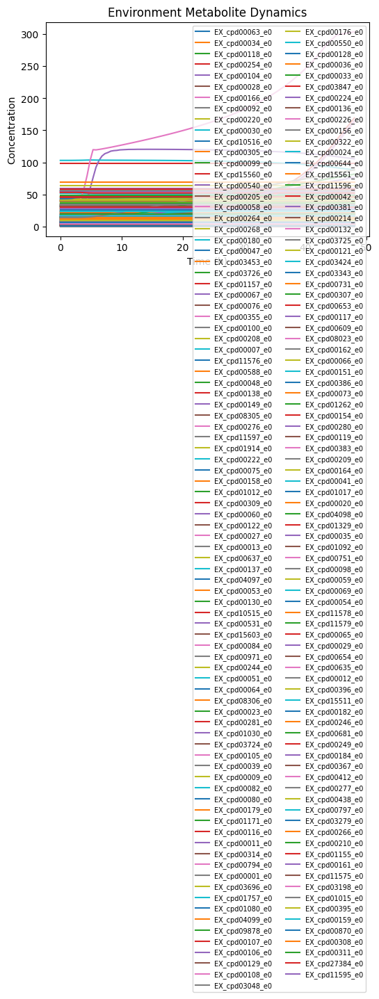

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.3376
   GCF_964063315.1_Leuconostoc_carnosum_CIRM-BIA2809_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.1882
   GCF_964063325.1_Hafnia_alvei_CIRM-BIA2718_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.1737
-- Group 7 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063345.1_Pseudomonas_lini_CIRM-BIA2854_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063355.1_Latilactobacillus_curvatus_CIRM-BIA2781_protein_gapfilled_noO2_appliedMedium.xml']


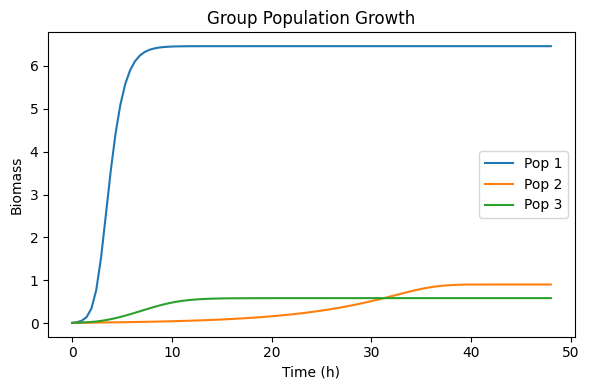

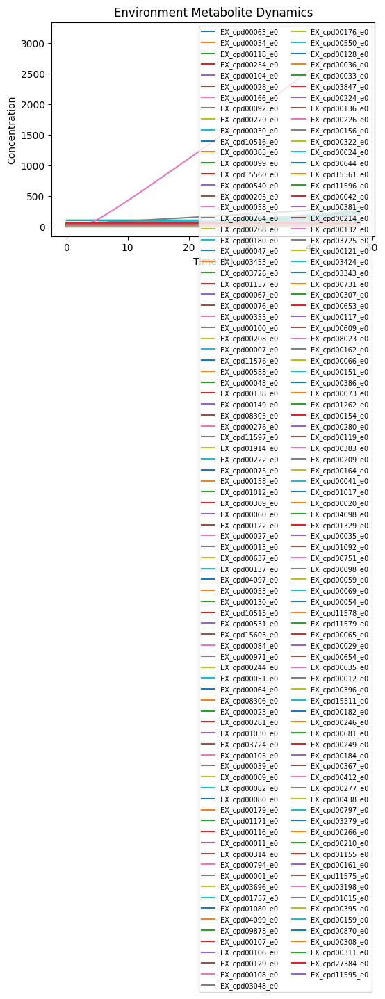

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4560
   GCF_964063345.1_Pseudomonas_lini_CIRM-BIA2854_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.9046
   GCF_964063355.1_Latilactobacillus_curvatus_CIRM-BIA2781_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.5869
-- Group 8 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063375.1_Bacillus_pumilus_CIRM-BIA2784_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063385.1_Latilactobacillus_curvatus_J116_protein_gapfilled_noO2_appliedMedium.xml']


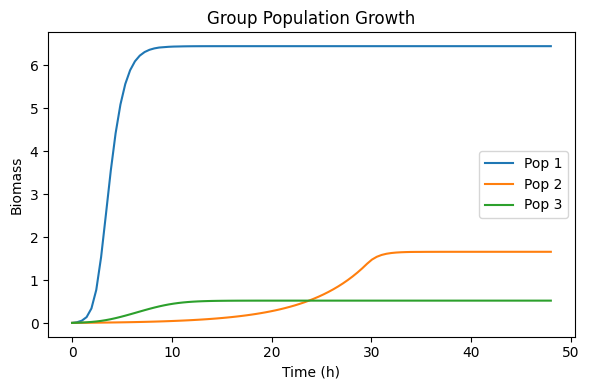

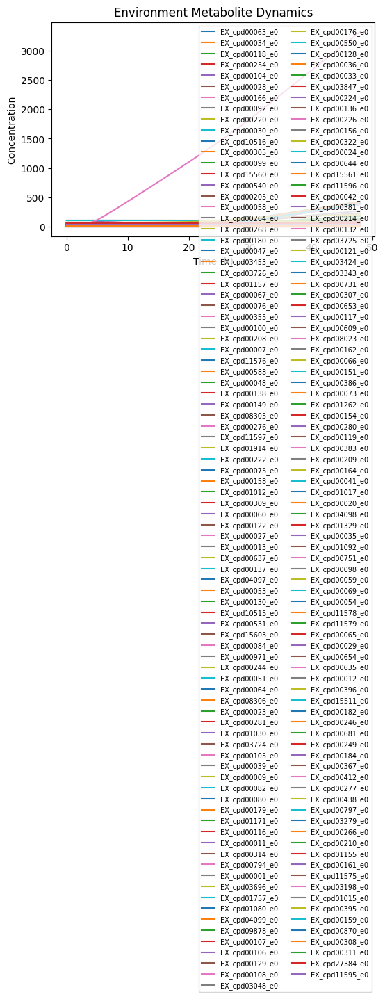

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4397
   GCF_964063375.1_Bacillus_pumilus_CIRM-BIA2784_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.6619
   GCF_964063385.1_Latilactobacillus_curvatus_J116_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.5271
-- Group 9 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063395.1_Pediococcus_parvulus_F2-sp2-RGJ_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063405.1_Leuconostoc_mesenteroides_FLEC04_protein_gapfilled_noO2_appliedMedium.xml']


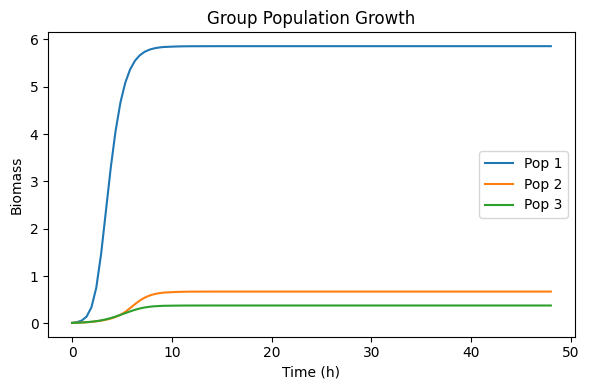

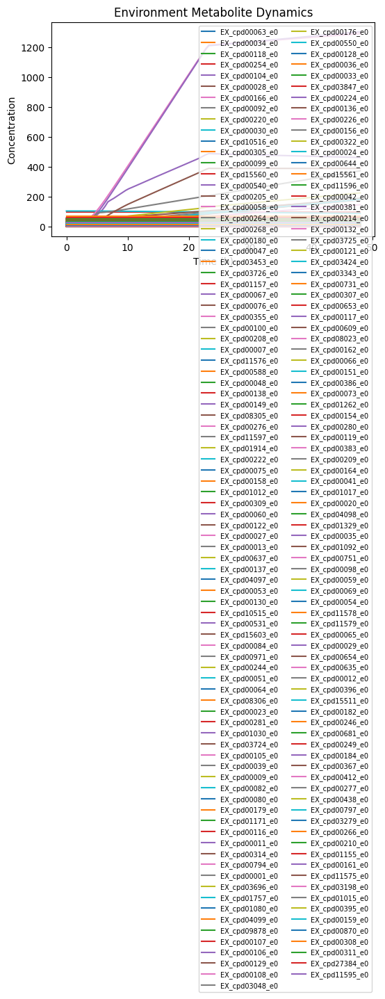

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   5.8562
   GCF_964063395.1_Pediococcus_parvulus_F2-sp2-RGJ_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.6715
   GCF_964063405.1_Leuconostoc_mesenteroides_FLEC04_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.3774
-- Group 10 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063415.1_Latilactobacillus_sakei_J33_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063425.1_Lactiplantibacillus_pentosus_CNRZ1547_protein_gapfilled_noO2_appliedMedium.xml']


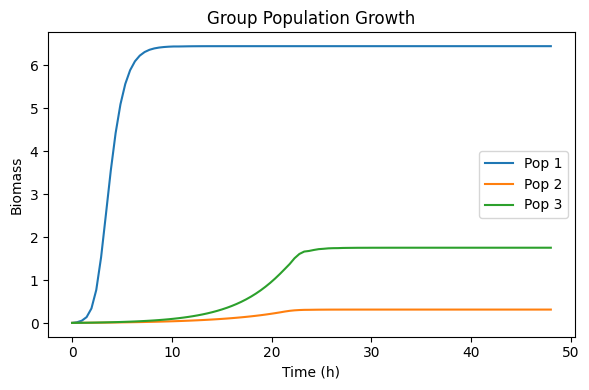

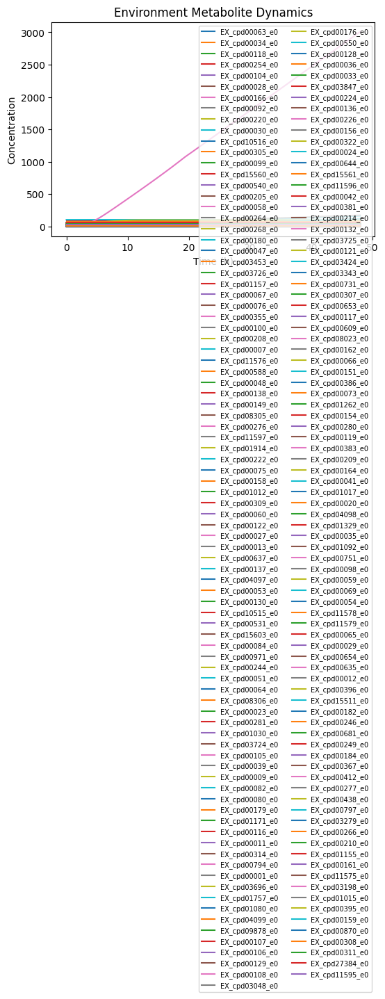

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4483
   GCF_964063415.1_Latilactobacillus_sakei_J33_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.3197
   GCF_964063425.1_Lactiplantibacillus_pentosus_CNRZ1547_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.7589
-- Group 11 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063445.1_Pediococcus_parvulus_IOEB-8801_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063755.1_Latilactobacillus_sakei_CIRM-BIA1912_protein_gapfilled_noO2_appliedMedium.xml']


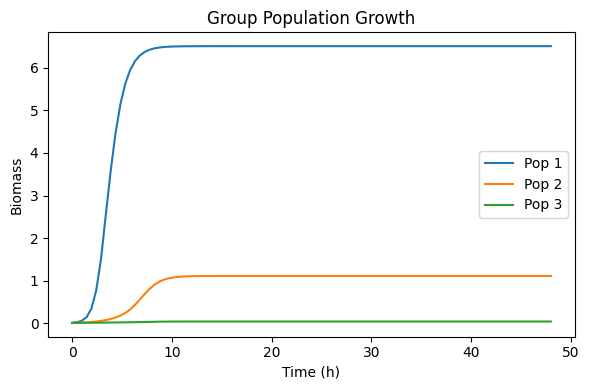

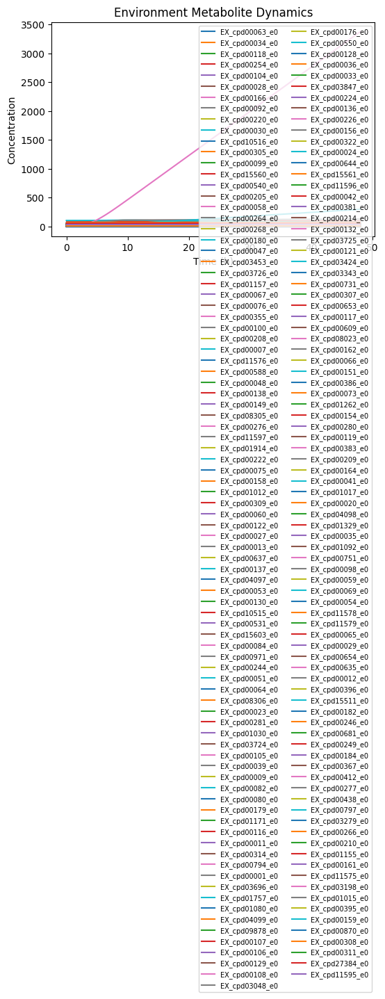

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.5063
   GCF_964063445.1_Pediococcus_parvulus_IOEB-8801_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.1121
   GCF_964063755.1_Latilactobacillus_sakei_CIRM-BIA1912_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.0423
-- Group 12 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065095.1_Lentilactobacillus_buchneri_CIRM-BIA2511_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065115.1_Levilactobacillus_brevis_CIRM-BIA2515_protein_gapfilled_noO2_appliedMedium.xml']


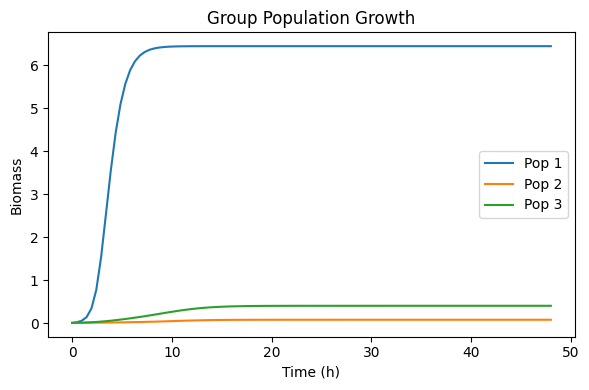

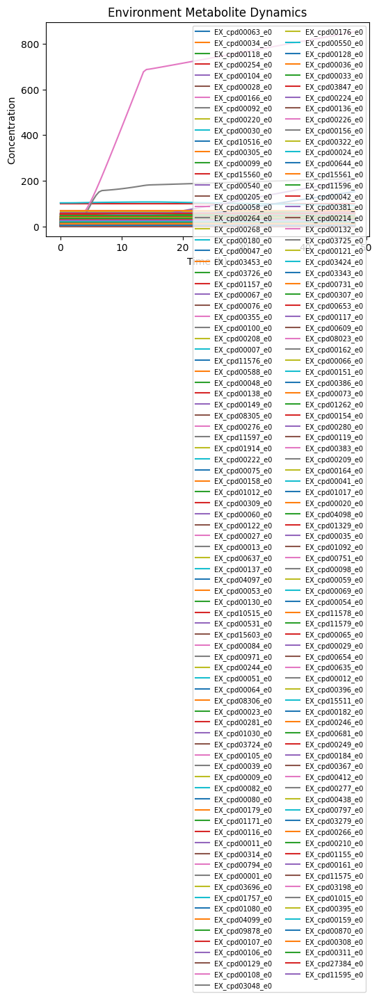

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4478
   GCF_964065095.1_Lentilactobacillus_buchneri_CIRM-BIA2511_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.0831
   GCF_964065115.1_Levilactobacillus_brevis_CIRM-BIA2515_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.4078
-- Group 13 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065165.1_Levilactobacillus_yonginensis_CIRM-BIA2544_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065205.1_Lacticaseibacillus_paracasei_CIRM-BIA2373_protein_gapfilled_noO2_appliedMedium.xml']


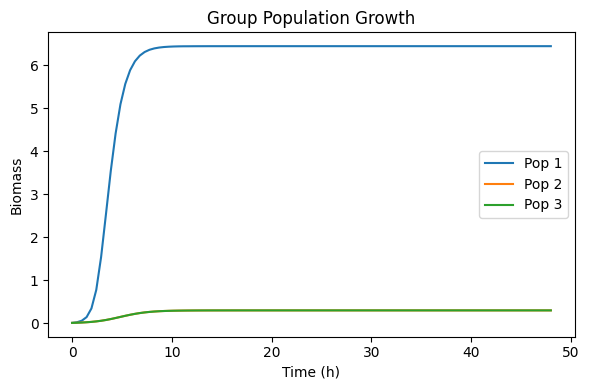

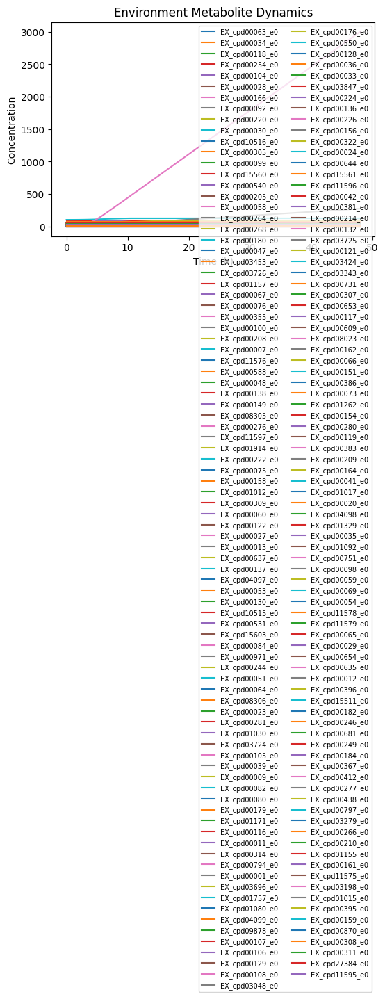

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4375
   GCF_964065165.1_Levilactobacillus_yonginensis_CIRM-BIA2544_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.3004
   GCF_964065205.1_Lacticaseibacillus_paracasei_CIRM-BIA2373_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.3004
-- Group 14 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065235.1_Leuconostoc_pseudomesenteroides_CIRM-BIA2446_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065245.1_Lactiplantibacillus_plantarum_CIRM-BIA2443_protein_gapfilled_noO2_appliedMedium.xml']


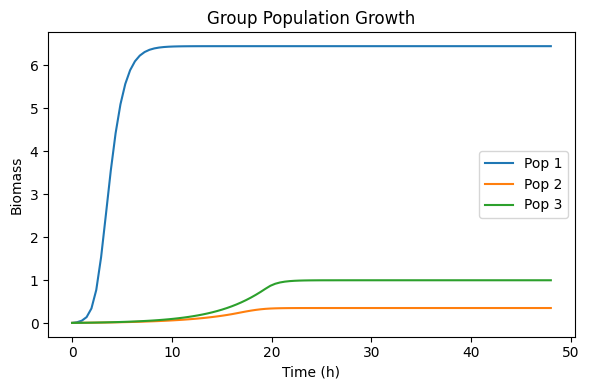

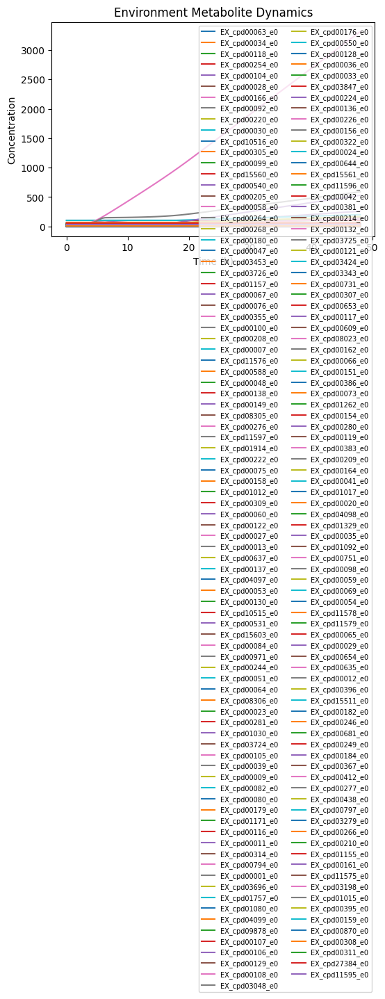

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4458
   GCF_964065235.1_Leuconostoc_pseudomesenteroides_CIRM-BIA2446_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.3556
   GCF_964065245.1_Lactiplantibacillus_plantarum_CIRM-BIA2443_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.0014
-- Group 15 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065285.1_Levilactobacillus_brevis_CIRM-BIA2444_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065435.1_Pediococcus_parvulus_CIRM-BIA2501_protein_gapfilled_noO2_appliedMedium.xml']


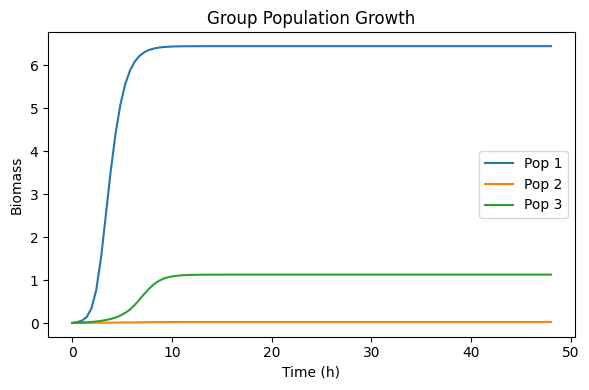

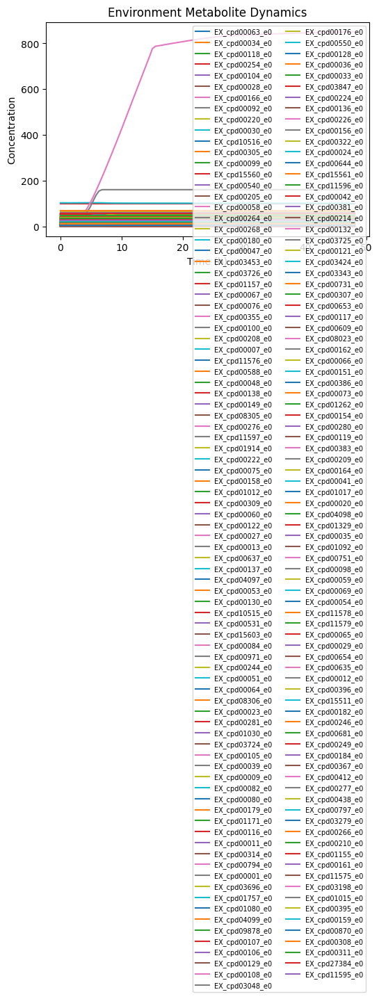

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4450
   GCF_964065285.1_Levilactobacillus_brevis_CIRM-BIA2444_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.0309
   GCF_964065435.1_Pediococcus_parvulus_CIRM-BIA2501_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.1322
-- Group 16 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065445.1_Lactiplantibacillus_plantarum_CIRM-BIA2453_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964065465.1_Liquorilactobacillus_satsumensis_CIRM-BIA2521_protein_gapfilled_noO2_appliedMedium.xml']


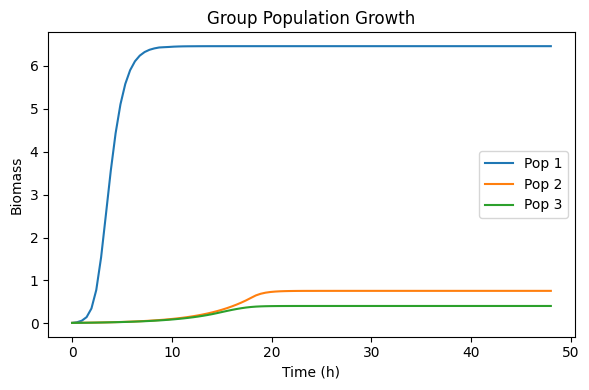

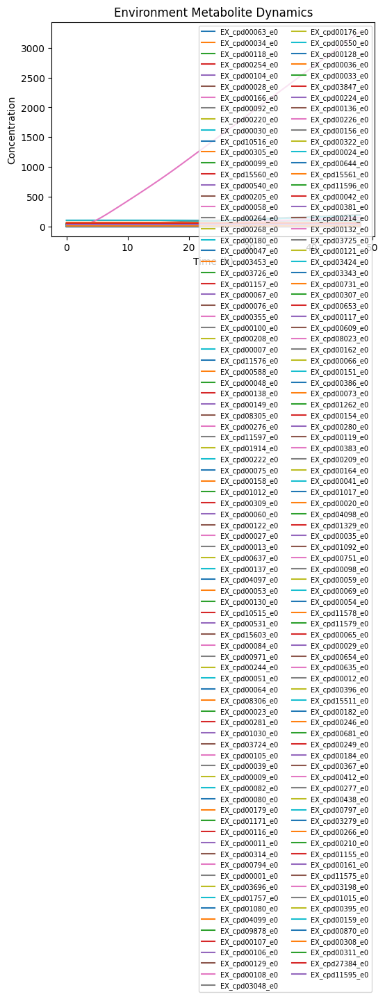

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4617
   GCF_964065445.1_Lactiplantibacillus_plantarum_CIRM-BIA2453_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.7568
   GCF_964065465.1_Liquorilactobacillus_satsumensis_CIRM-BIA2521_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.4043
-- Group 17 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964068245.1_Lentilactobacillus_kefiri_CIRM-BIA2539_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964069135.1_Schleiferilactobacillus_harbinensis_CIRM-BIA2388_protein_gapfilled_noO2_appliedMedium.xml']


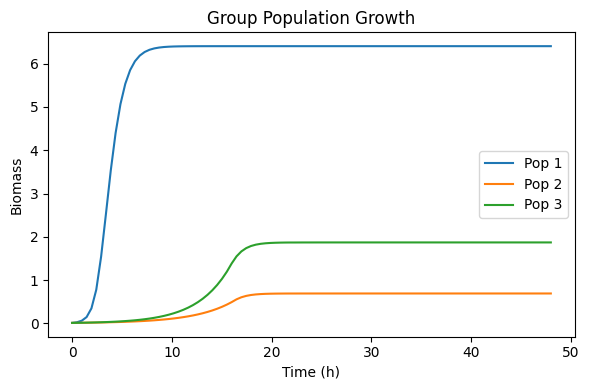

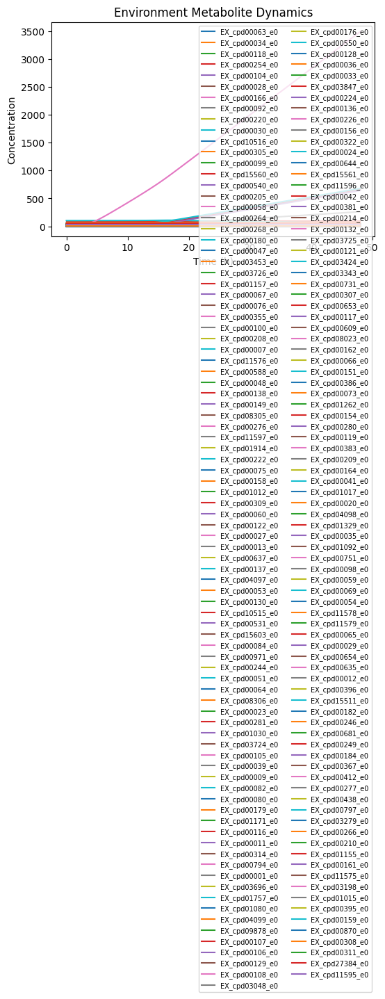

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4051
   GCF_964068245.1_Lentilactobacillus_kefiri_CIRM-BIA2539_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.6896
   GCF_964069135.1_Schleiferilactobacillus_harbinensis_CIRM-BIA2388_protein_gapfilled_noO2_appliedMedium.xml final biomass =   1.8695
-- Group 18 -- models: ['GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964084875.1_Leuconostoc_carnosum_A1b-VegA_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964084915.1_Lactiplantibacillus_plantarum_ATCC14431_protein_gapfilled_noO2_appliedMedium.xml']


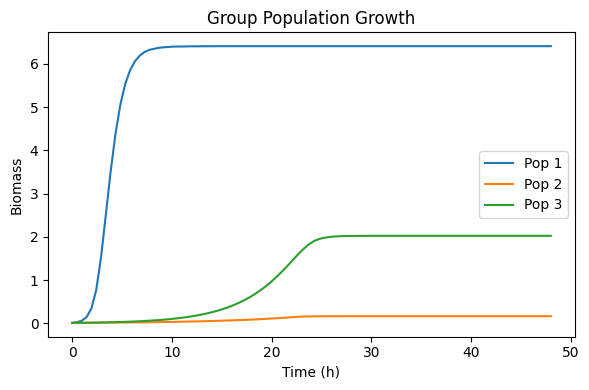

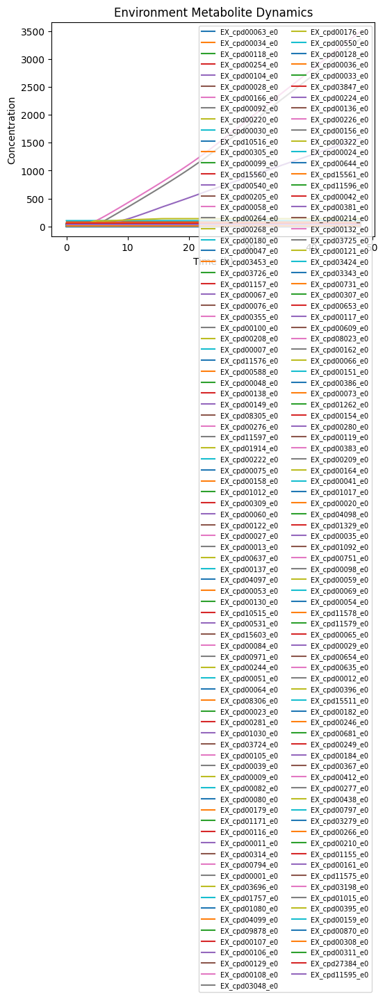

   GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml final biomass =   6.4084
   GCF_964084875.1_Leuconostoc_carnosum_A1b-VegA_protein_gapfilled_noO2_appliedMedium.xml final biomass =   0.1644
   GCF_964084915.1_Lactiplantibacillus_plantarum_ATCC14431_protein_gapfilled_noO2_appliedMedium.xml final biomass =   2.0232
** Environment 0: best target biomass = 6.5063 with partners ['GCF_964063445.1_Pediococcus_parvulus_IOEB-8801_protein_gapfilled_noO2_appliedMedium.xml', 'GCF_964063755.1_Latilactobacillus_sakei_CIRM-BIA1912_protein_gapfilled_noO2_appliedMedium.xml'] **

All results written to /content/results/dfba_final_biomass.csv


In [ ]:
# -*- coding: utf-8 -*-
"""
Group‑dynamic FBA runner (target‑in‑every‑group) — with CSV logging **and plotting**
=================================================================================

* Each group always contains the target model + (BATCH_SIZE‑1) partner models.
* **Plotting features**:
  - Figure 1: Biomass curves of all members in the group;
  - Figure 2: Combined environmental metabolite concentrations in the same plot.
* Results are written to `results/dfba_final_biomass.csv`, and the best partner combinations for each environment are printed.
"""

from __future__ import annotations

# ───────────────── Parameters ──────────────────
MODEL_DIR   = "models_gapfilled"
TARGET_FILE = "GCF_000010425.1_ASM1042v1_protein_gapfilled_noO2_appliedMedium.xml"
ENV_FILE    = "environment_ball.tsv"
BATCH_SIZE  = 3
TIME_SPAN   = (0, 48)
N_POINTS    = 100
INIT_BIOMASS = 0.01
MAX_UPTAKE   = 10.0
RESULT_DIR   = "results"
RESULT_CSV   = "dfba_final_biomass.csv"

# ──────────────────── Libraries ───────────────────
import gc
from math import ceil
from pathlib import Path

import cobra
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

cobra.Configuration().solver = "glpk"

# ─────────── Basic functions ───────────

def apply_env(model: cobra.Model, env: dict[str, float], upper_bound: float = MAX_UPTAKE):
    for rid, conc in env.items():
        if model.reactions.has_id(rid):
            rxn = model.reactions.get_by_id(rid)
            rxn.lower_bound = -abs(conc)
            rxn.upper_bound = upper_bound
    return model.optimize()


def avoid_zero_met(states, changes):
    return np.where(states + changes < 0, -states, changes)


def get_growth(model, env_names, env_state, sol0):
    uptake_bounds = {rid: env_state.get(rid, 0.0) / (env_state.get(rid, 0.0) + 1.0) for rid in env_names}
    sol = apply_env(model, uptake_bounds)
    mu = sol.objective_value
    fluxes = {rid: (sol.fluxes.get(rid, 0.0) if model.reactions.has_id(rid) else 0.0) for rid in env_names}
    return mu / sol0, fluxes


def simulate(models_orig, env_names, env_initial, *, t_span=TIME_SPAN, n_points=N_POINTS, show_plots=True):
    """Run dFBA for one group and optionally plot results."""
    n_models = len(models_orig)
    base_models = [m.copy() for m in models_orig]
    sol0s = [m.optimize().objective_value or 1e-9 for m in base_models]

    def ode(t, y):
        biomasses = np.maximum(y[:n_models], 0.0)
        mets = np.maximum(y[n_models:], 0.0)
        env_state = dict(zip(env_names, mets))
        d_bio = np.zeros(n_models)
        d_mets = np.zeros_like(mets)
        for i in range(n_models):
            mu_norm, fluxes = get_growth(base_models[i], env_names, env_state, sol0s[i])
            d_bio[i] = mu_norm * biomasses[i]
            d_mets += biomasses[i] * np.array([fluxes[r] for r in env_names])
        d_mets = avoid_zero_met(mets, d_mets)
        return np.concatenate((d_bio, d_mets))

    y0 = np.concatenate(([INIT_BIOMASS] * n_models, [env_initial.get(r, 0.0) for r in env_names]))
    sol = solve_ivp(ode, t_span, y0, t_eval=np.linspace(*t_span, n_points))

    if show_plots:
        # Figure 1: Biomass
        plt.figure(figsize=(6, 4))
        for i in range(n_models):
            plt.plot(sol.t, sol.y[i], label=f"Pop {i+1}")
        plt.xlabel("Time (h)"); plt.ylabel("Biomass"); plt.title("Group Population Growth")
        plt.legend(); plt.tight_layout(); plt.show()

        # Figure 2: Metabolites
        plt.figure(figsize=(6, 4))
        for j, rid in enumerate(env_names):
            plt.plot(sol.t, sol.y[n_models + j], label=rid)
        plt.xlabel("Time (h)"); plt.ylabel("Concentration"); plt.title("Environment Metabolite Dynamics")
        plt.legend(ncol=2, fontsize=7); plt.tight_layout(); plt.show()

    return sol

# ─────────── Utility functions ───────────

def load_environment_ball(path: str | Path):
    tbl = pd.read_csv(path, sep="\t")
    tbl["concentration"] = pd.to_numeric(tbl["concentration"], errors="coerce").fillna(0.0)
    if "env_id" in tbl.columns:
        for _, g in tbl.groupby("env_id"):
            yield dict(zip(g["metabolite_id"], g["concentration"]))
    else:
        n_met = tbl["metabolite_id"].nunique()
        for i in range(len(tbl) // n_met):
            chunk = tbl.iloc[i * n_met:(i + 1) * n_met]
            yield dict(zip(chunk["metabolite_id"], chunk["concentration"]))


def iter_model_paths(model_dir: str | Path):
    return sorted(Path(model_dir).glob("*.xml"))

# ─────────── Main process ───────────

def run_all():
    Path(RESULT_DIR).mkdir(parents=True, exist_ok=True)
    records = []

    # Split target and other models
    target_path = None
    other_paths = []
    for p in iter_model_paths(MODEL_DIR):
        if p.name == TARGET_FILE:
            target_path = p
        else:
            other_paths.append(p)
    if target_path is None:
        raise FileNotFoundError(f"Target model {TARGET_FILE} not found")
    if BATCH_SIZE < 2:
        raise ValueError("BATCH_SIZE must be ≥ 2")

    envs = list(load_environment_ball(ENV_FILE))
    chunk = BATCH_SIZE - 1
    num_groups = ceil(len(other_paths) / chunk) if other_paths else 1

    for env_id, env in enumerate(envs):
        env_names = list(env)
        print(f"\n================ Environment {env_id} ================")
        best_bio = -np.inf
        best_partners = []

        for g_idx in range(num_groups):
            group_other = other_paths[g_idx * chunk : g_idx * chunk + chunk]
            batch_paths = [target_path] + group_other
            print(f"-- Group {g_idx} -- models: {[p.name for p in batch_paths]}")

            models = [cobra.io.read_sbml_model(p) for p in batch_paths]
            sol = simulate(models, env_names, env)

            for i, p in enumerate(batch_paths):
                final_bio = sol.y[i, -1]
                print(f"   {p.name:<40} final biomass = {final_bio:>8.4f}")
                records.append({"env_id": env_id, "group_id": g_idx, "model_name": p.name, "final_biomass": final_bio})
                if p.name == TARGET_FILE and final_bio > best_bio:
                    best_bio = final_bio
                    best_partners = [q.name for q in batch_paths if q.name != TARGET_FILE]
            del models; gc.collect()

        print(f"** Environment {env_id}: best target biomass = {best_bio:.4f} with partners {best_partners} **")

    # Save results to CSV
    pd.DataFrame(records).to_csv(Path(RESULT_DIR) / RESULT_CSV, index=False)
    print(f"\nAll results written to {(Path(RESULT_DIR) / RESULT_CSV).resolve()}")

# ─────────── Execution ───────────
if __name__ == "__main__":
    run_all()


In [ ]:
import numpy as np
import csv
import cobra
import os

# ------------------------------------------------------------------------
# If the variable `metabolite_ids` has not been defined upstream, build it
# from the group_medium_exchanges.tsv file exactly as in the original NB.
# ------------------------------------------------------------------------
if "metabolite_ids" not in globals():
    medium_file = os.path.join("models_gapfilled", "group_medium_exchanges.tsv")
    medium_dict = {}
    with open(medium_file) as fh:
        next(fh)                                      # skip header
        for ln in fh:
            cols = ln.strip().split("\t")
            medium_dict[cols[0]] = cols[2]

    # Make sure water and oxygen are present under the expected IDs
    medium_dict.setdefault("EX_cpd00001_e0", "h2o")       # water
    medium_dict.setdefault("EX_cpd00007_e0", "o2")        # oxygen

    metabolite_ids = list(medium_dict.keys())
    print(f"[Auto-load] Retrieved {len(metabolite_ids)} metabolite IDs "
          f"from '{medium_file}'")

# =============================================================================
# EnvBall class (water + oxygen fixed, English logs, behaviour unchanged)
# =============================================================================
class EnvBall:
    """
    Generate *k* random media, keep water **and oxygen** fixed at target values,
    save to TSV, and/or apply to COBRA models. All numerical details follow the
    original script.
    """
    def __init__(
        self,
        metabolite_ids,
        k: int = 100,
        water_id: str = "EX_cpd00001_e0",
        water_target: float = 10.0,
        oxygen_id: str = "EX_cpd00007_e0",
        oxygen_target: float = 100.0,
        random_state: int | None = None,
    ):
        # ------------------------------------------------------------------
        # Ensure both water and oxygen are present in the metabolites list
        # ------------------------------------------------------------------
        self.metabolite_ids = list(metabolite_ids)
        if water_id not in self.metabolite_ids:
            self.metabolite_ids.append(water_id)
        if oxygen_id not in self.metabolite_ids:
            self.metabolite_ids.append(oxygen_id)

        self.k              = int(k)
        self.water_id       = water_id
        self.water_target   = float(water_target)
        self.oxygen_id      = oxygen_id
        self.oxygen_target  = float(oxygen_target)

        try:
            self.idx_water = self.metabolite_ids.index(self.water_id)
            self.idx_oxygen = self.metabolite_ids.index(self.oxygen_id)
        except ValueError as err:
            # This should not happen thanks to the checks above
            raise ValueError("Required metabolite not found in metabolite list") from err

        self.n_mets = len(self.metabolite_ids)
        print(f"Metabolites per environment: {self.n_mets}")

        if random_state is not None:
            np.random.seed(random_state)

        # Pre‑build all environments
        self._env_vectors = [self._build_single_env(i) for i in range(self.k)]

    # -----------------------------------------------------------------
    def _build_single_env(self, idx: int):
        # Sample a random composition
        vec = np.random.dirichlet(np.ones(self.n_mets))
        print(f"\n[Env {idx}] Sum before scaling: {vec.sum():.6f}")

        # Scale everything so that water hits its target concentration
        vec /= vec[self.idx_water]
        vec *= self.water_target

        # Override oxygen concentration *after* water scaling
        vec[self.idx_oxygen] = self.oxygen_target

        print(f"[Env {idx}] Composition (water = {self.water_target}, oxygen = {self.oxygen_target}):")
        for m, v in zip(self.metabolite_ids, vec):
            print(f"  {m}: {v}")
        return vec

    # -----------------------------------------------------------------
    # Public API
    # -----------------------------------------------------------------
    def get_env(self, idx: int = 0):
        if not 0 <= idx < self.k:
            raise IndexError("Environment index out of range")
        return self._env_vectors[idx].copy()

    def save_tsv(self, idx: int = 0, filename: str = "environment_ball.tsv"):
        vec = self.get_env(idx)
        with open(filename, "w", newline="") as fh:
            writer = csv.writer(fh, delimiter="\t")
            writer.writerow(["metabolite_id", "concentration"])
            writer.writerows(zip(self.metabolite_ids, vec))
        print(f"\n✔ Environment {idx} saved to '{filename}'")

    def apply_to_model(
        self,
        model: cobra.Model,
        idx: int = 0,
        default_secretion: float = 100,
    ):
        env_vec  = self.get_env(idx)
        env_dict = dict(zip(self.metabolite_ids, env_vec))
        for rxn_id, conc in env_dict.items():
            if model.reactions.has_id(rxn_id):
                rxn = model.reactions.get_by_id(rxn_id)
                rxn.lower_bound = -conc
                rxn.upper_bound = default_secretion
        print(f"✔ Environment {idx} applied to model '{model.id}'")

# ------------------------------------------------------------------------
# Example usage — create *k* environments and save them ALL into one TSV
# with an additional env_id column.
# ------------------------------------------------------------------------
if __name__ == "__main__":
    # Create the environment ball (oxygen fixed at 100)
    ball = EnvBall(metabolite_ids, k=100, random_state=None,
                   oxygen_target=100.0)

    # Save every environment with env_id
    with open("environment_ball.tsv", "w", newline="") as fh:
        writer = csv.writer(fh, delimiter="\t")
        writer.writerow(["env_id", "metabolite_id", "concentration"])
        for env_idx in range(ball.k):
            vec = ball.get_env(env_idx)
            writer.writerows(
                [[env_idx, met_id, conc] for met_id, conc
                 in zip(ball.metabolite_ids, vec)]
            )
    print("✔ 10000 environments written to 'environment_ball.tsv'")


流式输出内容被截断，只能显示最后 5000 行内容。
  EX_cpd03279_e0: 63.39387667791685
  EX_cpd00266_e0: 29.335329921661288
  EX_cpd00210_e0: 1.669172620414808
  EX_cpd01155_e0: 26.002418861823557
  EX_cpd00161_e0: 28.9930746144507
  EX_cpd11575_e0: 5.835645890399
  EX_cpd03198_e0: 20.976823740745985
  EX_cpd01015_e0: 0.32121003980543966
  EX_cpd00395_e0: 8.382948124634604
  EX_cpd00159_e0: 8.746027270705845
  EX_cpd00870_e0: 3.385767875938935
  EX_cpd00308_e0: 2.526707481962674
  EX_cpd00311_e0: 5.998859398342741
  EX_cpd27384_e0: 22.053648856280873
  EX_cpd11595_e0: 25.783112436499067

[Env 72] Sum before scaling: 1.000000
[Env 72] Composition (water = 10.0, oxygen = 100.0):
  EX_cpd00063_e0: 11.751186719241407
  EX_cpd00034_e0: 5.874787943487871
  EX_cpd00118_e0: 6.103800122325449
  EX_cpd00254_e0: 8.469635975273711
  EX_cpd00104_e0: 24.58756641876593
  EX_cpd00028_e0: 0.46492482210858277
  EX_cpd00166_e0: 20.84121397213074
  EX_cpd00092_e0: 4.0455763285835635
  EX_cpd00220_e0: 18.93451355741718
  EX_cpd00

In [ ]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Build a library of random anaerobic media with water = 10 and oxygen = 100
------------------------------------------------------------------------
* Generates *k* environments at once and saves them to `environment_ball.tsv`.
* Public API (`get_env`, `save_tsv`, `apply_to_model`) unchanged.
"""

import numpy as np
import csv
import cobra
import os

# ─────────────────────────────────────────────────────────────
# Build `metabolite_ids` from group_medium_exchanges.tsv if not provided
# ─────────────────────────────────────────────────────────────
if "metabolite_ids" not in globals():
    medium_file = os.path.join("models_gapfilled", "group_medium_exchanges.tsv")
    medium_dict = {}
    with open(medium_file) as fh:
        next(fh)                       # skip header
        for ln in fh:
            cols = ln.strip().split("\t")
            medium_dict[cols[0]] = cols[2]

    medium_dict.setdefault("EX_cpd00001_e0", "h2o")   # water
    medium_dict.setdefault("EX_cpd00007_e0", "o2")    # oxygen

    metabolite_ids = list(medium_dict.keys())
    print(f"[Auto-load] Retrieved {len(metabolite_ids)} metabolite IDs "
          f"from '{medium_file}'")

# ─────────────────────────────────────────────────────────────
# EnvBall class
# ─────────────────────────────────────────────────────────────
class EnvBall:
    def __init__(
        self,
        metabolite_ids,
        k: int = 100,
        water_id: str = "EX_cpd00001_e0",
        water_target: float = 10.0,
        oxygen_id: str = "EX_cpd00007_e0",
        oxygen_target: float = 100.0,
        random_state: int | None = None,
    ):
        self.metabolite_ids = list(metabolite_ids)
        if water_id not in self.metabolite_ids:
            self.metabolite_ids.append(water_id)
        if oxygen_id not in self.metabolite_ids:
            self.metabolite_ids.append(oxygen_id)

        self.k, self.water_id, self.oxygen_id = int(k), water_id, oxygen_id
        self.water_target, self.oxygen_target = float(water_target), float(oxygen_target)
        self.idx_water  = self.metabolite_ids.index(self.water_id)
        self.idx_oxygen = self.metabolite_ids.index(self.oxygen_id)
        self.n_mets = len(self.metabolite_ids)
        print(f"Metabolites per environment: {self.n_mets}")

        if random_state is not None:
            np.random.seed(random_state)

        self._env_vectors = [self._build_single_env(i) for i in range(self.k)]

    # ---------------------------------------------------------
    def _build_single_env(self, idx: int):
        vec = np.random.dirichlet(np.ones(self.n_mets))
        print(f"\n[Env {idx}] Sum before scaling: {vec.sum():.6f}")

        # ① 先把氧气槽设定为固定值
        vec[self.idx_oxygen] = self.oxygen_target

        # ② 再按水浓度缩放，使水 = 10
        vec /= vec[self.idx_water]
        vec *= self.water_target

        print(f"[Env {idx}] Composition (water→{self.water_target}, "
              f"oxygen initially 100, after scaling ≈ {vec[self.idx_oxygen]:.2f}):")
        for mid, conc in zip(self.metabolite_ids, vec):
            print(f"  {mid}: {conc}")
        return vec

    # ---------------- Public helpers ----------------
    def get_env(self, idx: int = 0):
        if not 0 <= idx < self.k:
            raise IndexError("Environment index out of range")
        return self._env_vectors[idx].copy()

    def save_tsv(self, idx: int = 0, filename: str = "environment_ball.tsv"):
        vec = self.get_env(idx)
        with open(filename, "w", newline="") as fh:
            writer = csv.writer(fh, delimiter="\t")
            writer.writerow(["metabolite_id", "concentration"])
            writer.writerows(zip(self.metabolite_ids, vec))
        print(f"✔ Environment {idx} saved to '{filename}'")

    def apply_to_model(self, model: cobra.Model, idx: int = 0, default_secretion: float = 100):
        env_vec = self.get_env(idx)
        for rxn_id, conc in zip(self.metabolite_ids, env_vec):
            if model.reactions.has_id(rxn_id):
                rxn = model.reactions.get_by_id(rxn_id)
                rxn.lower_bound = -conc
                rxn.upper_bound = default_secretion
        print(f"✔ Environment {idx} applied to model '{model.id}'")

# ─────────────────────────────────────────────────────────────
# Example CLI use: build k environments & write one big TSV
# ─────────────────────────────────────────────────────────────
if __name__ == "__main__":
    ball = EnvBall(metabolite_ids, k=100, oxygen_target=100.0)

    with open("environment_ball.tsv", "w", newline="") as fh:
        writer = csv.writer(fh, delimiter="\t")
        writer.writerow(["env_id", "metabolite_id", "concentration"])
        for env_idx in range(ball.k):
            vec = ball.get_env(env_idx)
            writer.writerows(
                [[env_idx, mid, conc] for mid, conc in zip(ball.metabolite_ids, vec)]
            )
    print("✔ 100 environments written to 'environment_ball.tsv'")


流式输出内容被截断，只能显示最后 5000 行内容。
  EX_cpd03279_e0: 7.9746096866826734
  EX_cpd00266_e0: 4.925835839512146
  EX_cpd00210_e0: 2.7635742339608687
  EX_cpd01155_e0: 4.18063453249721
  EX_cpd00161_e0: 1.6635677795572503
  EX_cpd11575_e0: 0.4296178555924236
  EX_cpd03198_e0: 0.2347703642093964
  EX_cpd01015_e0: 10.33816724431234
  EX_cpd00395_e0: 0.9106003279114547
  EX_cpd00159_e0: 1.4834689543377242
  EX_cpd00870_e0: 2.920952590706306
  EX_cpd00308_e0: 5.136788681539008
  EX_cpd00311_e0: 0.6932517156105795
  EX_cpd27384_e0: 3.185975103579472
  EX_cpd11595_e0: 0.19369757849486957

[Env 72] Sum before scaling: 1.000000
[Env 72] Composition (water→10.0, oxygen initially 100, after scaling ≈ 59099.76):
  EX_cpd00063_e0: 2.2061791829655113
  EX_cpd00034_e0: 4.161027089886947
  EX_cpd00118_e0: 0.3412641463968744
  EX_cpd00254_e0: 1.6087208539096038
  EX_cpd00104_e0: 2.323080638868445
  EX_cpd00028_e0: 2.185492104255564
  EX_cpd00166_e0: 12.268986643503354
  EX_cpd00092_e0: 0.12194936351500595
  EX_cpd

对于environment_ball的修改：如果水已在列表中，会从 metabolite_ids 中移除它，再在构造环境时单独处理。使用固定种子，先按该向量把“水”缩放到目标浓度 water_target，再覆盖把“氧气”强置到 oxygen_target，在 _build_single_env 里直接取预先生成的 dirichletSample[idx]，整体放大 100 倍，既不再调整“水”的浓度（因为水已被剔除），也不涉及氧气。对于modelisation部分的修改：